In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA


In [3]:
# ============================================
# 1. 데이터 로딩 
# ============================================

# 
DATA_ROOT =  r"C:\Users\kjhye\Dropbox\Python\Sea Surface Tem(SSS)\XBT\XBT\data\dataset_2017_to_2020-01"  
csv_path  = os.path.join(DATA_ROOT, "depth_0p0.csv")

df = pd.read_csv(csv_path)

# depth 컬럼 제거 (선배: drop=["depth"])
if "depth" in df.columns:
    df = df.drop(columns=["depth"])

print("원본 컬럼:", list(df.columns))
print(df.head())


원본 컬럼: ['time', 'lat', 'lon', 'water_temp']
                  time    lat        lon  water_temp
0  2017-01-01 00:00:00  36.32  129.43994   13.901999
1  2017-01-01 00:00:00  36.32  129.52002   14.464000
2  2017-01-01 00:00:00  36.32  129.59998   15.462999
3  2017-01-01 00:00:00  36.32  129.67993   15.646000
4  2017-01-01 00:00:00  36.32  129.76001   16.197000


In [4]:
# time / lat / lon / temp 컬럼 자동 매핑
cols = list(df.columns)

# time 후보: 이름에 'time'이 들어간 컬럼
time_col_candidates = [c for c in cols if "time" in c.lower()]
lat_col_candidates  = [c for c in cols if "lat"  in c.lower()]
lon_col_candidates  = [c for c in cols if "lon"  in c.lower()]

if time_col_candidates:
    time_col = time_col_candidates[0]
else:
    time_col = cols[0]  # 안전빵 fall-back

if lat_col_candidates:
    lat_col = lat_col_candidates[0]
else:
    lat_col = cols[1]

if lon_col_candidates:
    lon_col = lon_col_candidates[0]
else:
    lon_col = cols[2]

# 나머지 하나를 temp 로 간주
temp_candidates = [c for c in cols if c not in [time_col, lat_col, lon_col]]
if temp_candidates:
    temp_col = temp_candidates[0]
else:
    raise ValueError("안되용")

print("매핑: time=", time_col, ", lat=", lat_col, ", lon=", lon_col, ", temp=", temp_col)

_data = pd.DataFrame({
    "time": df[time_col],
    "lat":  df[lat_col],
    "lon":  df[lon_col],
    "temp": df[temp_col],
})


매핑: time= time , lat= lat , lon= lon , temp= water_temp


In [5]:
# 위도/경도 소수 둘째 자리까지 반올림 
_data["lat"] = _data["lat"].astype(float).round(2)
_data["lon"] = _data["lon"].astype(float).round(2)

# 시간 파싱 (DateTime(yyyy-mm-dd HH:MM:SS))
_data["time"] = pd.to_datetime(_data["time"])

# 고유 축
T = np.sort(_data["time"].unique())
Y = np.sort(_data["lat"].unique())
X = np.sort(_data["lon"].unique())

nT, nY, nX = len(T), len(Y), len(X)
print("시간축 길이 nT:", nT)
print("위도 개수 nY:", nY)
print("경도 개수 nX:", nX)


시간축 길이 nT: 8883
위도 개수 nY: 25
경도 개수 nX: 10


In [6]:
# ============================================
# 2. 텐서 tnsr[y,x,t] 생성
# ============================================

#  rename!(_data, [:t,:y,:x,:z])
_data.rename(columns={"time": "t", "lat": "y", "lon": "x", "temp": "z"}, inplace=True)

# 인덱스 매핑 (Dict(T .=> 1:nT) ...)
t_map = {t: i for i, t in enumerate(T)}
y_map = {y: i for i, y in enumerate(Y)}
x_map = {x: i for i, x in enumerate(X)}

_data["ti"] = _data["t"].map(t_map)
_data["yi"] = _data["y"].map(y_map)
_data["xi"] = _data["x"].map(x_map)

# 3D 텐서 (모든 칸 0으로 시작)
tnsr = np.zeros((nY, nX, nT), dtype=float)

for yi, xi, ti, z in _data[["yi", "xi", "ti", "z"]].itertuples(index=False):
    tnsr[yi, xi, ti] = z

print("원본 tnsr shape:", tnsr.shape)

# 위도 방향 downsampling → _tnsr = _tnsr[1:2:end, :, :]
y_idx_keep = np.arange(0, nY, 2)  # 0,2,4,...
tnsr_ds = tnsr[y_idx_keep, :, :]
Y_ds = Y[y_idx_keep]
nY_ds = len(Y_ds)

print("downsample 후 tnsr_ds shape:", tnsr_ds.shape)  # (nY_ds, nX, nT)


원본 tnsr shape: (25, 10, 8883)
downsample 후 tnsr_ds shape: (13, 10, 8883)


In [7]:
# ============================================
# 3. train/test 분할 (cut_trng = findlast(T < 2019-01-01))
# ============================================

CUTOFF_DATE = np.datetime64("2019-01-01")

idx = np.where(T < CUTOFF_DATE)[0]
if len(idx) == 0:
    raise ValueError("2019-01-01 이전 시간이 없습니다. T[0], T[-1]을 한번 확인해줘.")

cut_trng = idx[-1]  # 마지막 index

trng = tnsr_ds[:, :, :cut_trng+1]   # train
test = tnsr_ds[:, :, cut_trng+1:]   # test

T_train = T[:cut_trng+1]
T_test  = T[cut_trng+1:]

nY2, nX2, nTrain = trng.shape
_,   _,   nTest  = test.shape

print("train 길이:", nTrain)
print("test 길이 :", nTest)


train 길이: 5758
test 길이 : 3125


In [8]:
# ============================================
# 4. 격자별 ARIMA 예측
# ============================================

ARIMA_ORDER = (1, 1, 1)

def fit_forecast_one(series, steps, order=(1,1,1)):
    series = np.asarray(series, dtype=float)
    # 전부 0이면 그냥 0 예측
    if np.allclose(series, 0):
        return np.zeros(steps)
    s = pd.Series(series)
    s = s.replace([np.inf, -np.inf], np.nan).interpolate(limit_direction="both")
    try:
        model = ARIMA(s.values, order=order,
                      enforce_stationarity=False,
                      enforce_invertibility=False)
        res = model.fit()
        fc = res.forecast(steps=steps)
        return np.asarray(fc)
    except Exception:
        # 실패하면 마지막 값 고정 예측
        return np.repeat(s.values[-1], steps)

pred = np.zeros_like(test)

for i in range(nY2):
    for j in range(nX2):
        fc = fit_forecast_one(trng[i, j, :], nTest, ARIMA_ORDER)
        pred[i, j, :] = fc

print("pred shape:", pred.shape)


pred shape: (13, 10, 3125)


전체 test 평균 MAE : 4.218987475248304
전체 test 평균 RMSE: 4.440100251896061


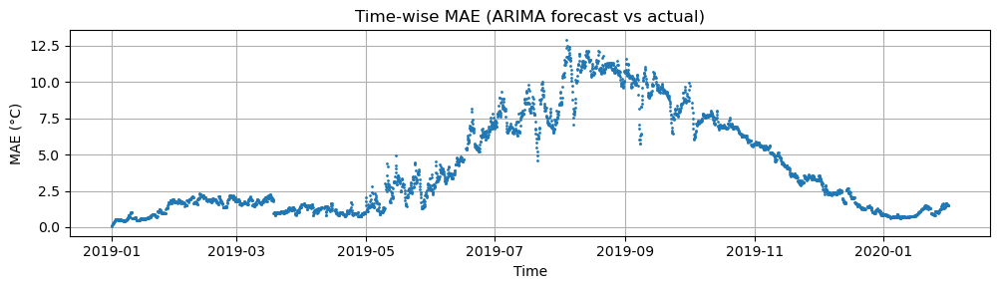

In [9]:
# ============================================
# 5. Metrics (MAE, RMSE) + 그래프
# ============================================

mae_t = np.mean(np.abs(test - pred), axis=(0, 1))
rmse_t = np.sqrt(np.mean((test - pred)**2, axis=(0, 1)))

print("전체 test 평균 MAE :", float(mae_t.mean()))
print("전체 test 평균 RMSE:", float(rmse_t.mean()))

plt.figure(figsize=(10, 3))
plt.plot(T_test, mae_t, marker=".", linestyle="None", markersize=2)
plt.title("Time-wise MAE (ARIMA forecast vs actual)")
plt.xlabel("Time")
plt.ylabel("MAE (°C)")
plt.grid(True)
plt.tight_layout()
plt.show()


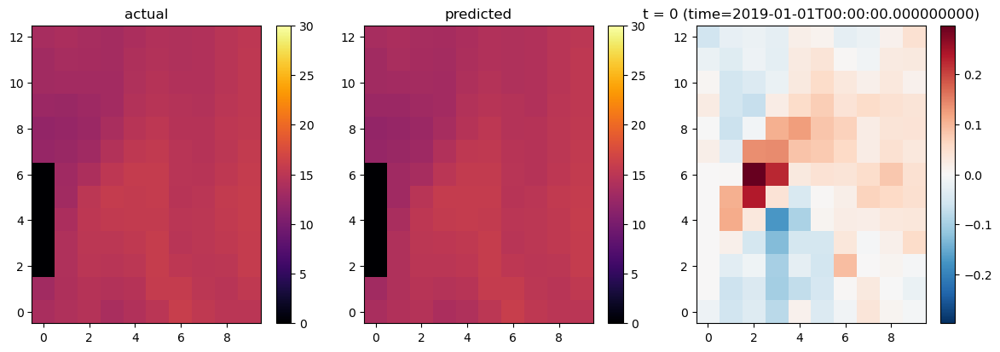

In [10]:
# ============================================
# 6. heatmap: actual / predicted / residual
# ============================================

def plot_frame(ti, stride_y=1, stride_x=1):
    """
    test 시점 index = ti 에 대해
    actual / predicted / residual 3패널 heatmap
    """
    actual_k = test[:, :, ti]
    pred_k   = pred[:, :, ti]
    resid_k  = actual_k - pred_k

    # 해상도 줄이기 (optional)
    actual_k = actual_k[::stride_y, ::stride_x]
    pred_k   = pred_k[::stride_y, ::stride_x]
    resid_k  = resid_k[::stride_y, ::stride_x]

    #0을 NaN으로 안 바꾸고 clims=(0,20) 사용 → 그대로 따라감
    vmin, vmax = 0, 30   # 표층 수온 범위에 맞게 (필요하면 조정)

    maxabs = np.max(np.abs(resid_k))
    vmin_r, vmax_r = -maxabs, maxabs

    cmap_temp = plt.cm.inferno
    cmap_res  = plt.cm.RdBu_r

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    im0 = axes[0].imshow(actual_k, origin="lower",
                         aspect="equal", cmap=cmap_temp,
                         vmin=vmin, vmax=vmax)
    axes[0].set_title("actual")
    fig.colorbar(im0, ax=axes[0])

    im1 = axes[1].imshow(pred_k, origin="lower",
                         aspect="equal", cmap=cmap_temp,
                         vmin=vmin, vmax=vmax)
    axes[1].set_title("predicted")
    fig.colorbar(im1, ax=axes[1])

    im2 = axes[2].imshow(resid_k, origin="lower",
                         aspect="equal", cmap=cmap_res,
                         vmin=vmin_r, vmax=vmax_r)
    axes[2].set_title(f"t = {ti} (time={T_test[ti]})")
    fig.colorbar(im2, ax=axes[2])

    plt.tight_layout()
    plt.show()

# 예: test 첫 시점 ( t=0 hour)
plot_frame(0, stride_y=1, stride_x=1)



>>> t index = 0, time = 2019-01-01T00:00:00.000000000


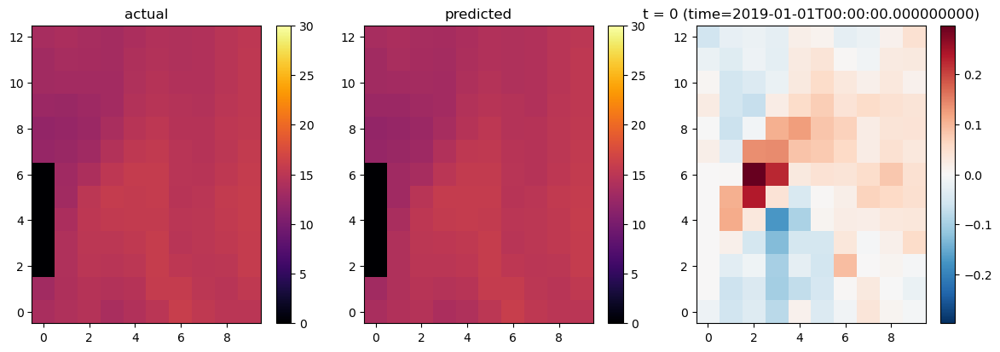


>>> t index = 24, time = 2019-01-04T00:00:00.000000000


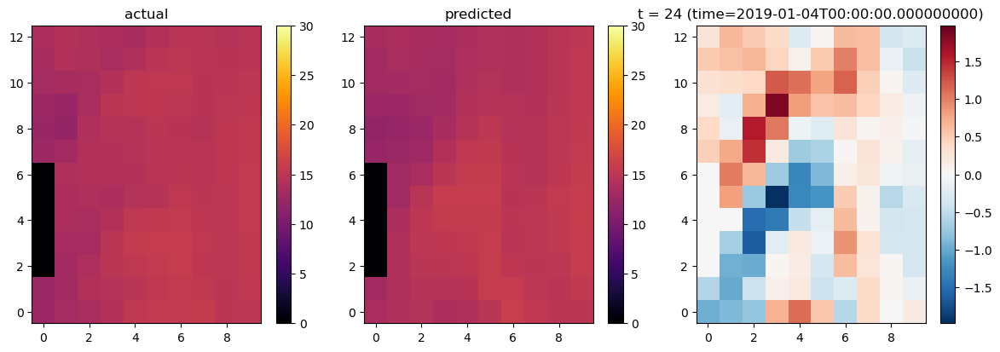


>>> t index = 48, time = 2019-01-07T00:00:00.000000000


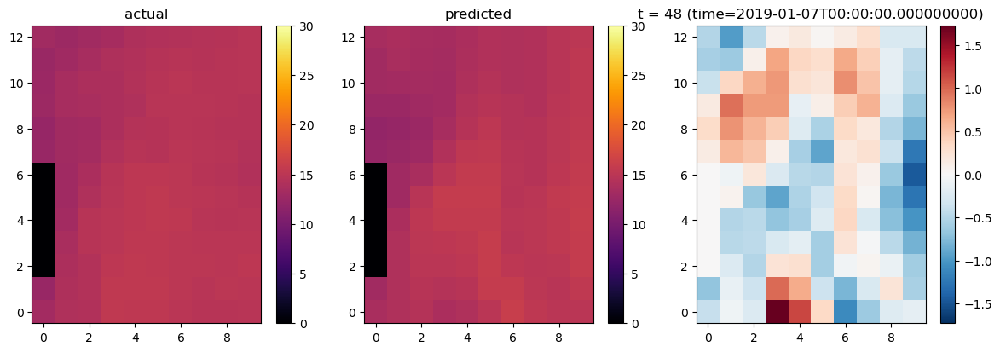


>>> t index = 72, time = 2019-01-10T00:00:00.000000000


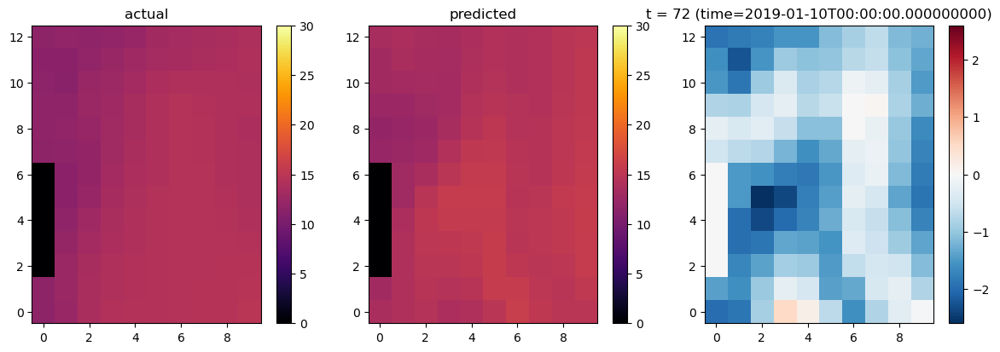


>>> t index = 96, time = 2019-01-13T00:00:00.000000000


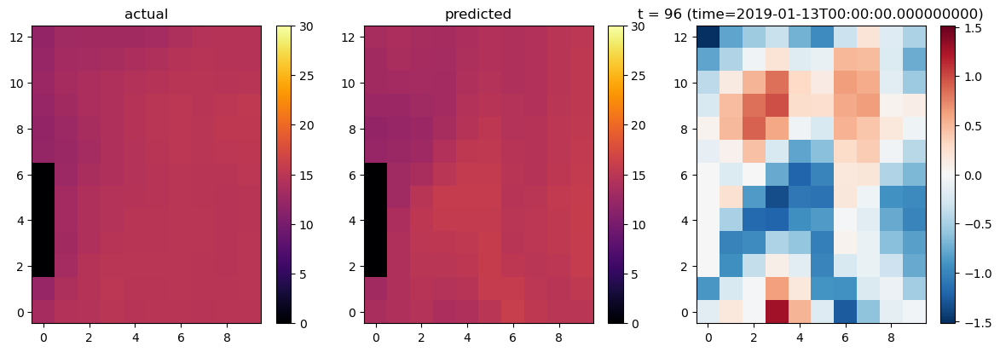


>>> t index = 120, time = 2019-01-16T00:00:00.000000000


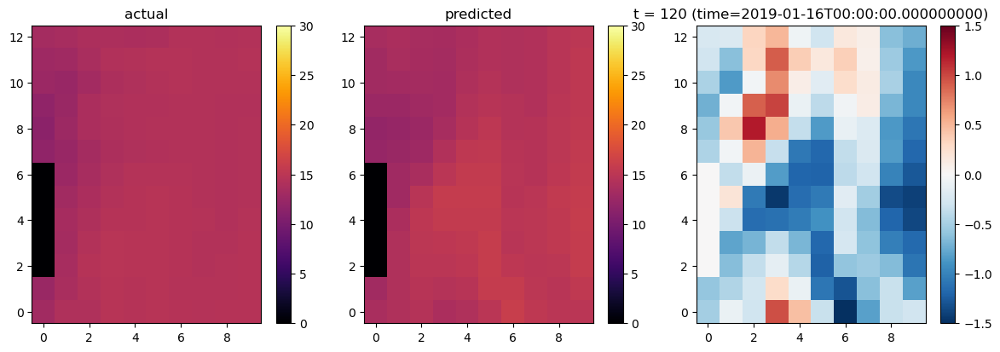


>>> t index = 144, time = 2019-01-19T00:00:00.000000000


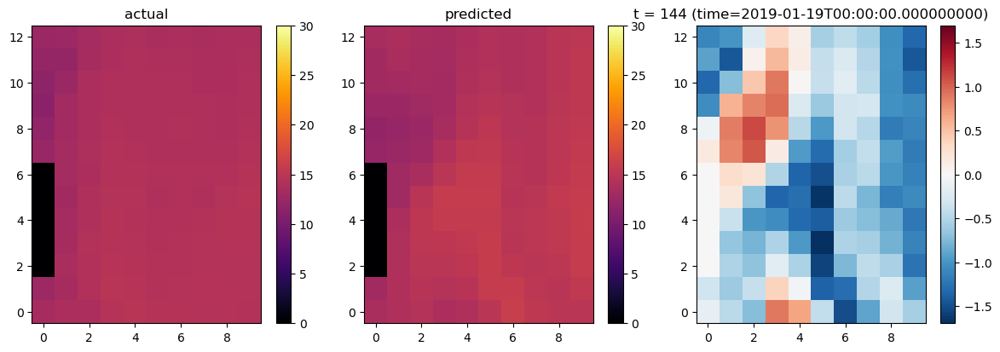


>>> t index = 168, time = 2019-01-22T00:00:00.000000000


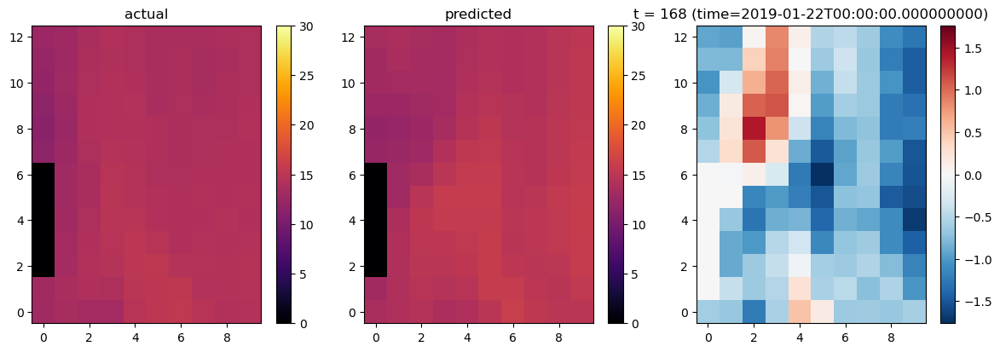


>>> t index = 192, time = 2019-01-25T00:00:00.000000000


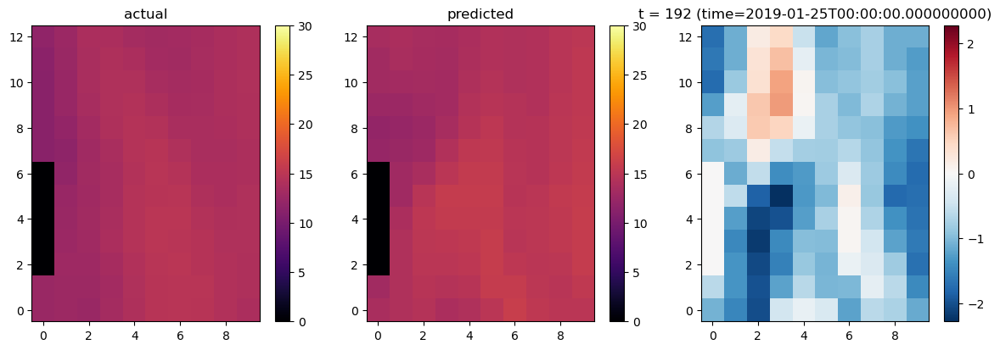


>>> t index = 216, time = 2019-01-28T00:00:00.000000000


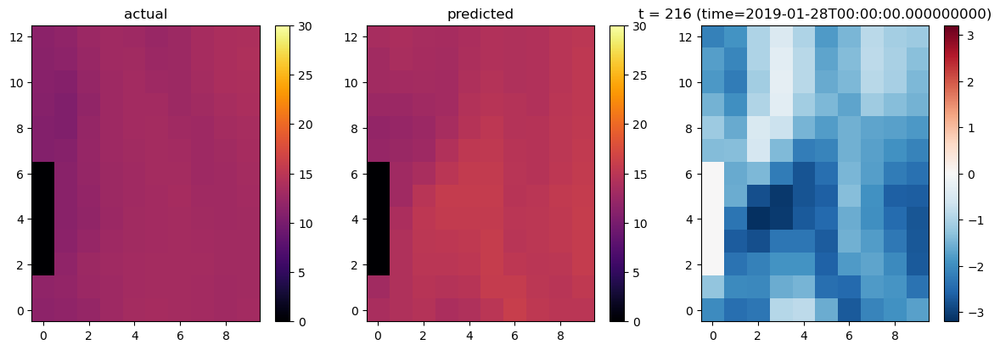


>>> t index = 240, time = 2019-01-31T00:00:00.000000000


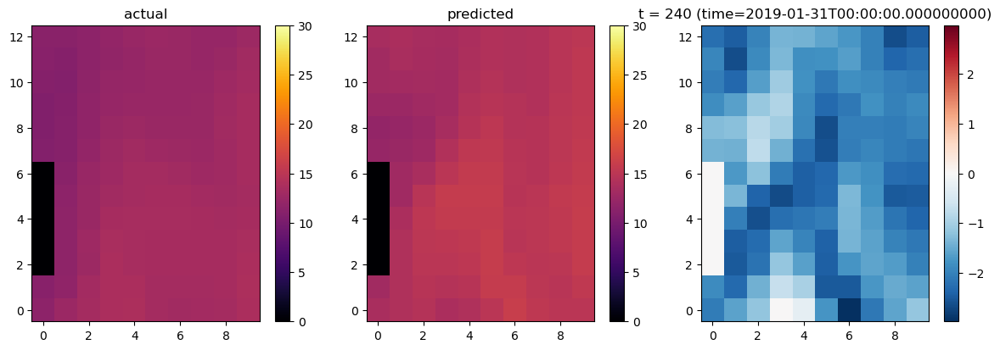


>>> t index = 264, time = 2019-02-03T00:00:00.000000000


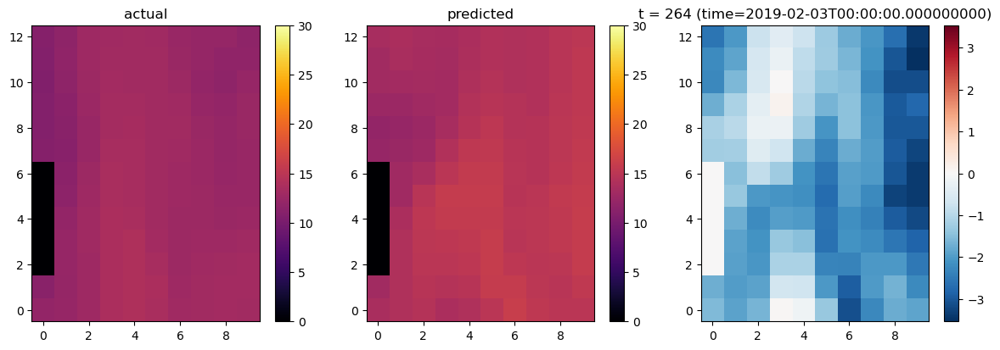


>>> t index = 288, time = 2019-02-06T00:00:00.000000000


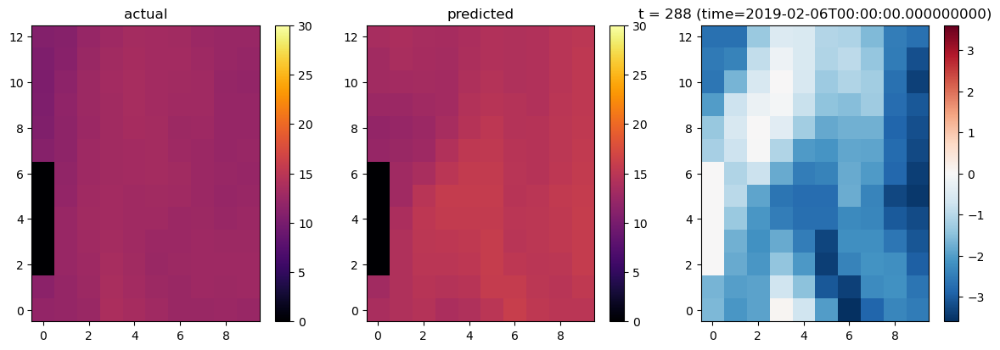


>>> t index = 312, time = 2019-02-09T00:00:00.000000000


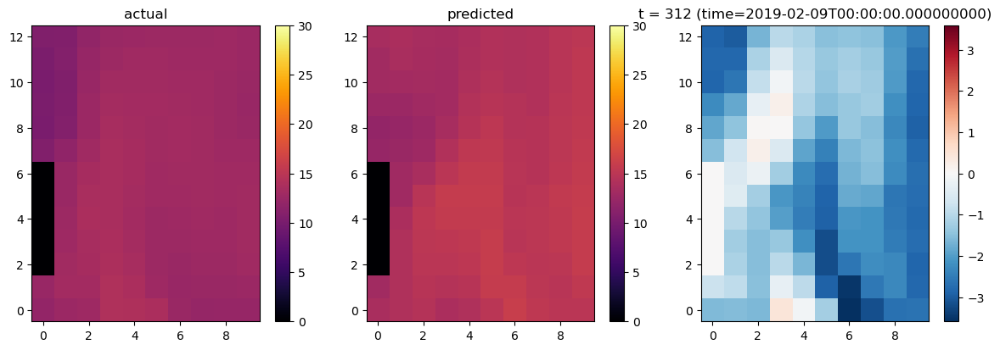


>>> t index = 336, time = 2019-02-12T00:00:00.000000000


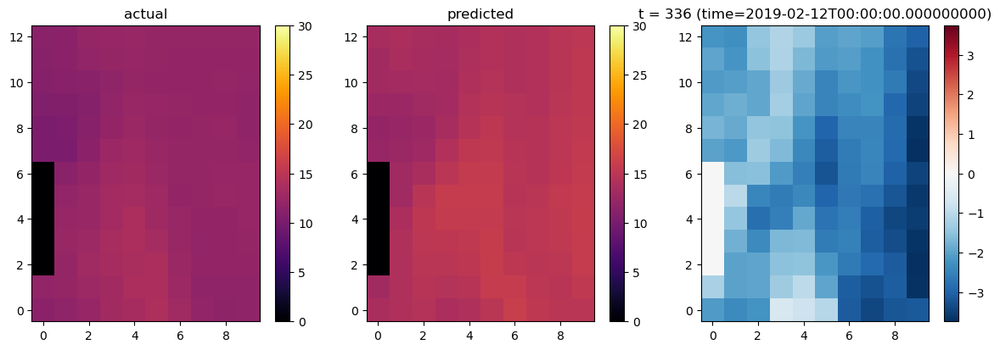


>>> t index = 360, time = 2019-02-15T00:00:00.000000000


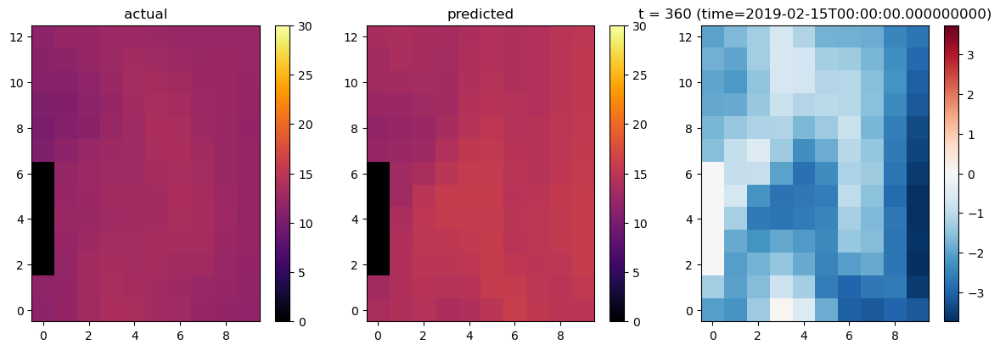


>>> t index = 384, time = 2019-02-18T00:00:00.000000000


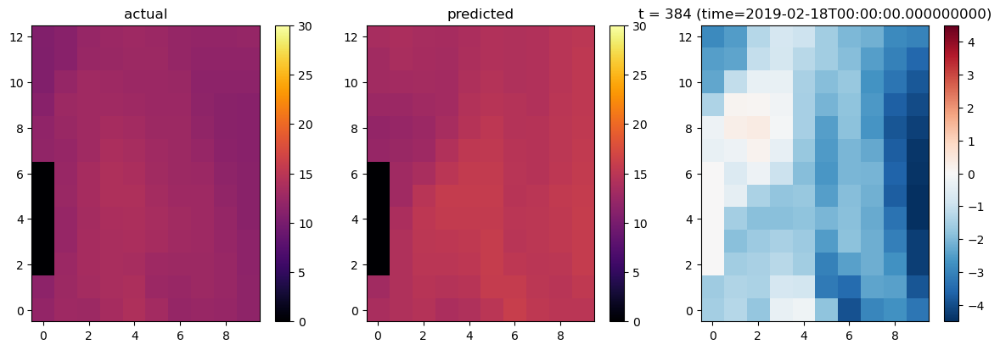


>>> t index = 408, time = 2019-02-21T00:00:00.000000000


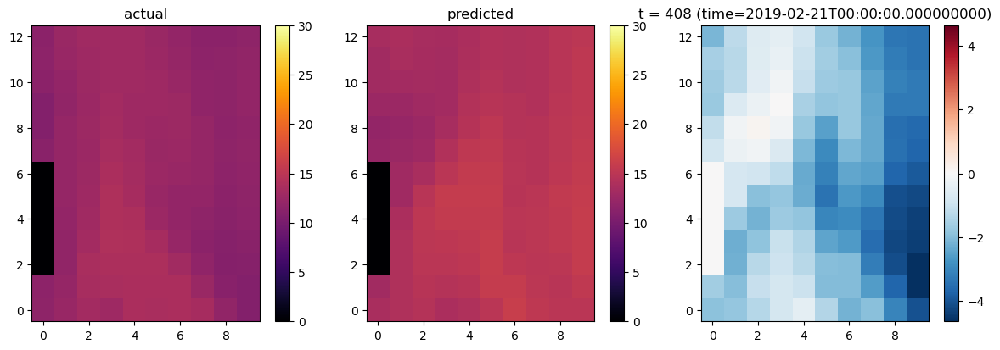


>>> t index = 432, time = 2019-02-24T00:00:00.000000000


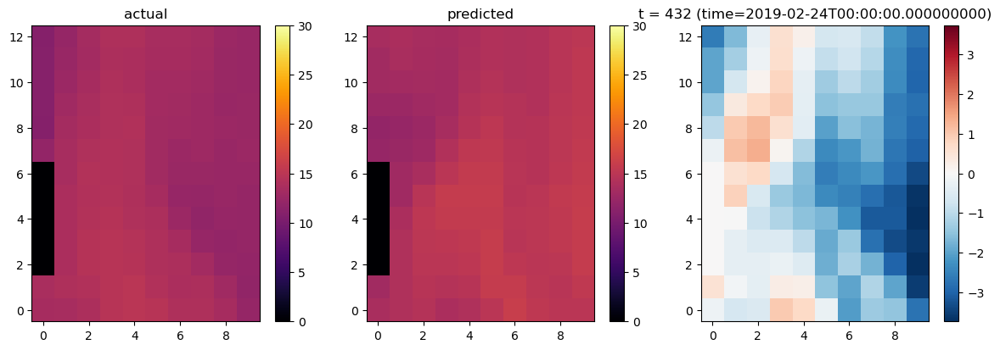


>>> t index = 456, time = 2019-02-27T00:00:00.000000000


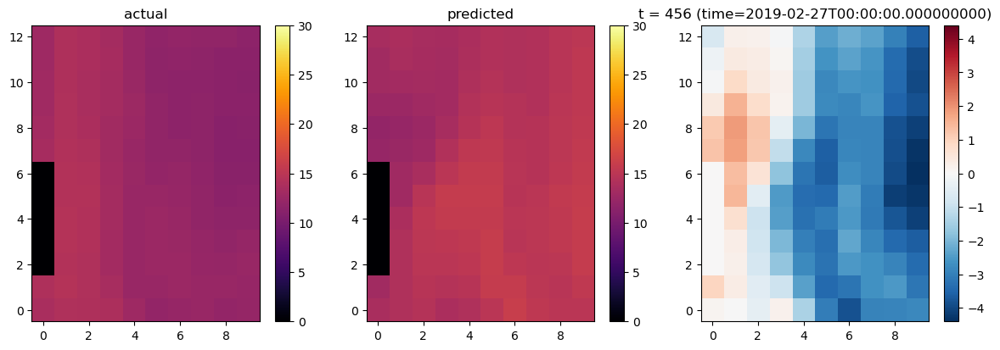


>>> t index = 480, time = 2019-03-02T00:00:00.000000000


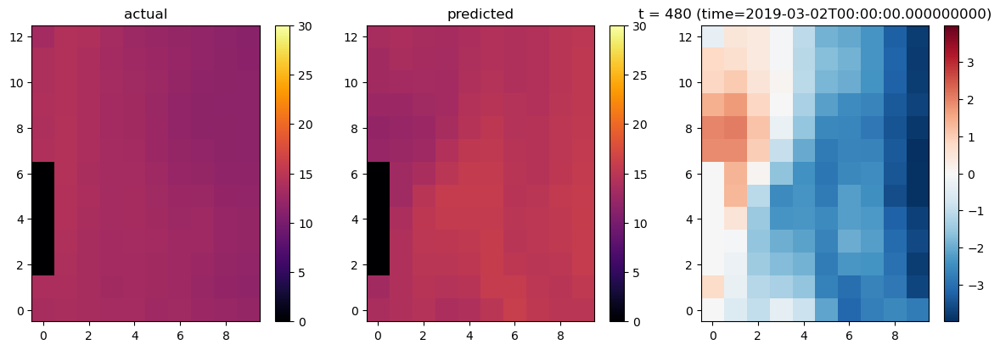


>>> t index = 504, time = 2019-03-05T00:00:00.000000000


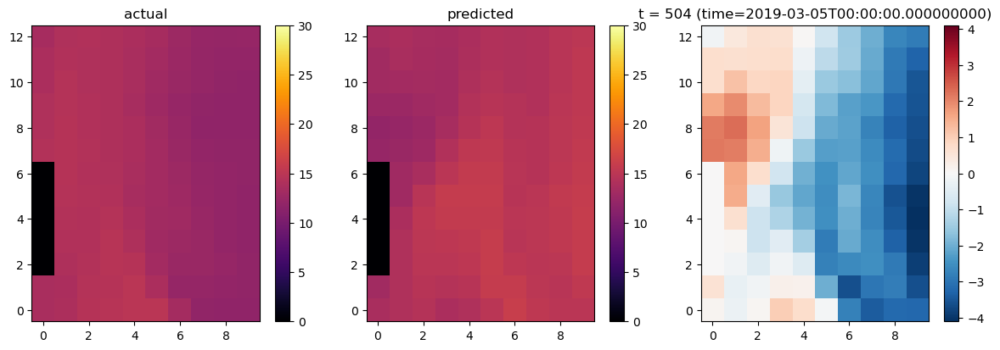


>>> t index = 528, time = 2019-03-08T00:00:00.000000000


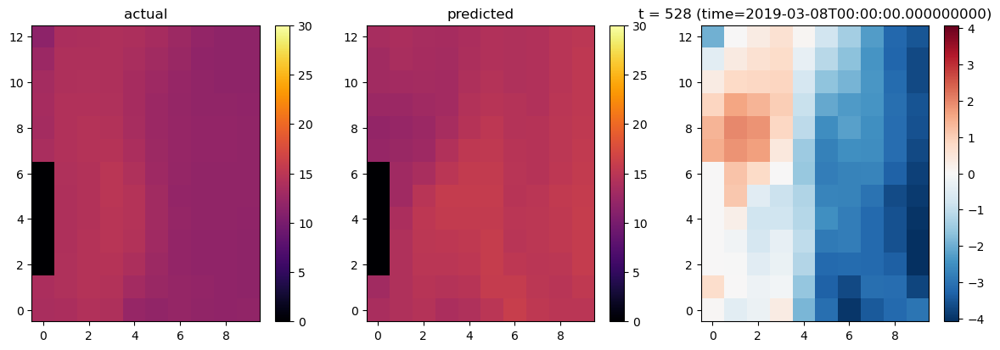


>>> t index = 552, time = 2019-03-11T00:00:00.000000000


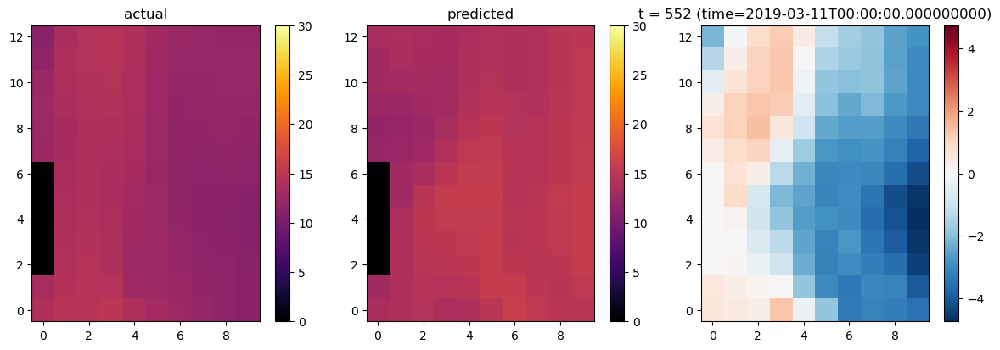


>>> t index = 576, time = 2019-03-14T00:00:00.000000000


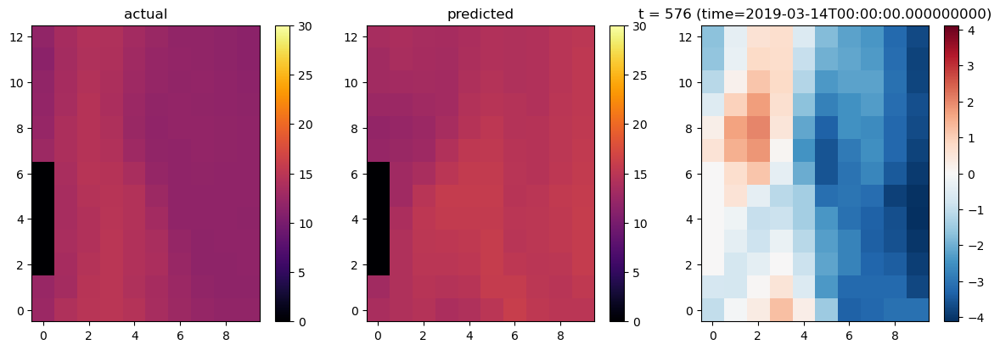


>>> t index = 600, time = 2019-03-17T00:00:00.000000000


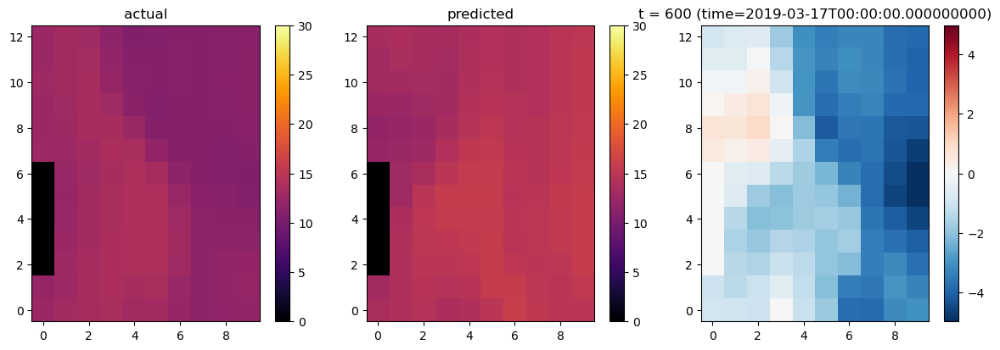


>>> t index = 624, time = 2019-03-20T00:00:00.000000000


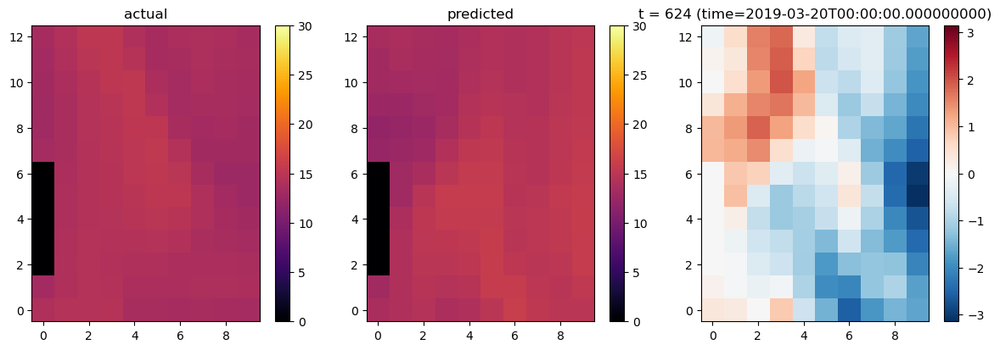


>>> t index = 648, time = 2019-03-23T00:00:00.000000000


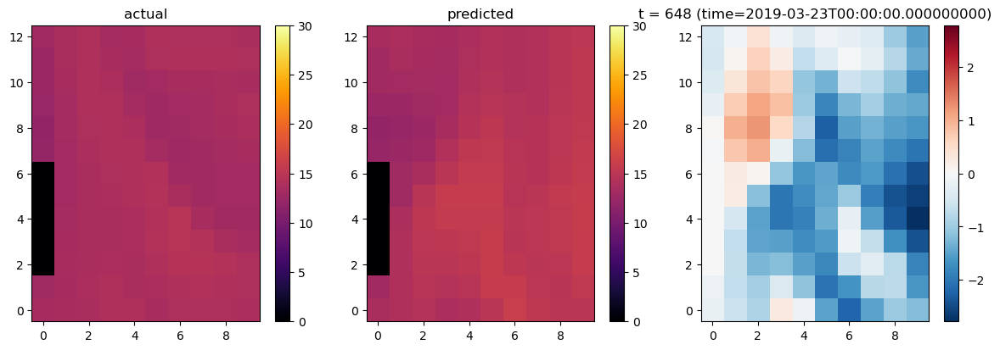


>>> t index = 672, time = 2019-03-26T00:00:00.000000000


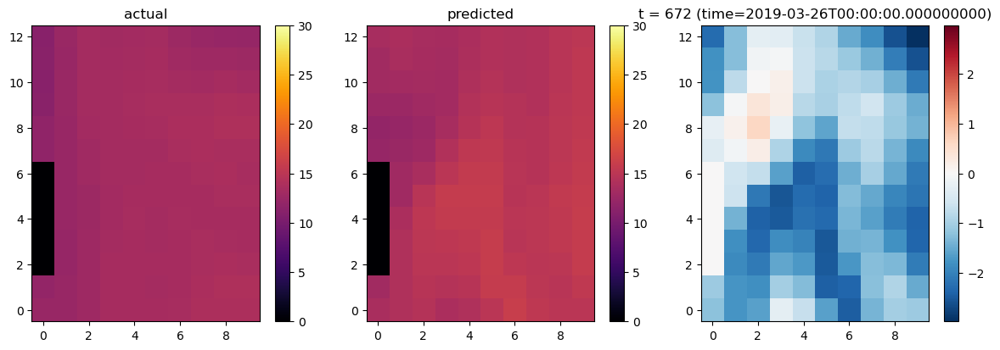


>>> t index = 696, time = 2019-03-29T00:00:00.000000000


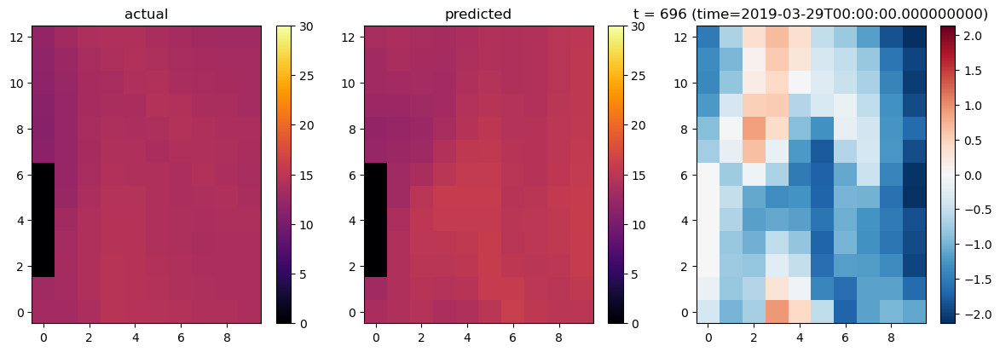


>>> t index = 720, time = 2019-04-01T00:00:00.000000000


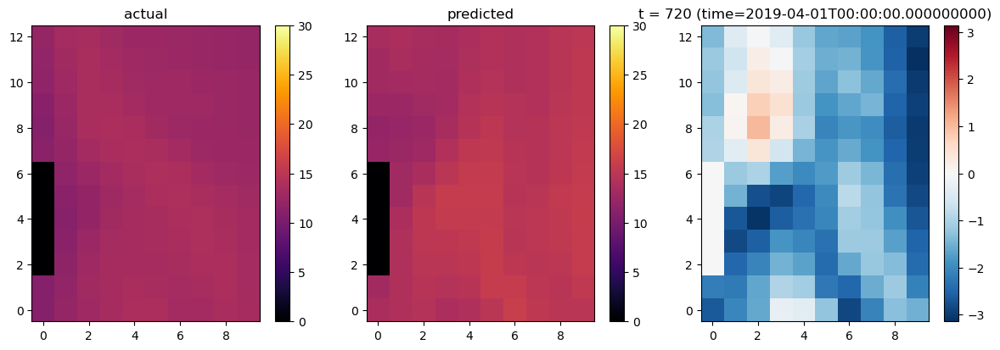


>>> t index = 744, time = 2019-04-04T00:00:00.000000000


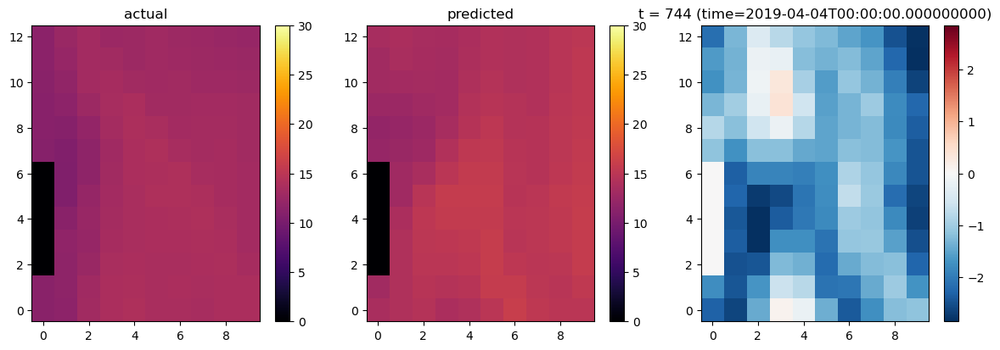


>>> t index = 768, time = 2019-04-07T00:00:00.000000000


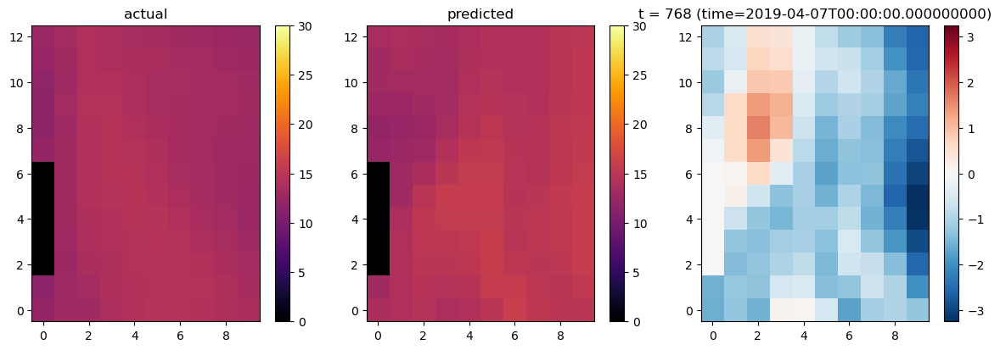


>>> t index = 792, time = 2019-04-10T00:00:00.000000000


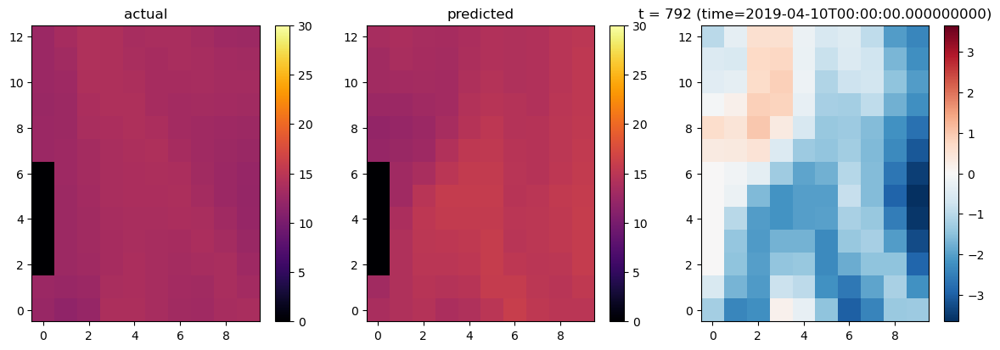


>>> t index = 816, time = 2019-04-14T00:00:00.000000000


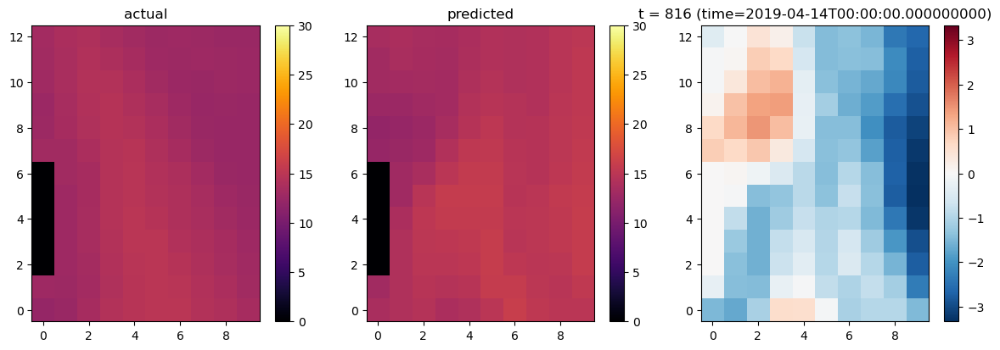


>>> t index = 840, time = 2019-04-18T00:00:00.000000000


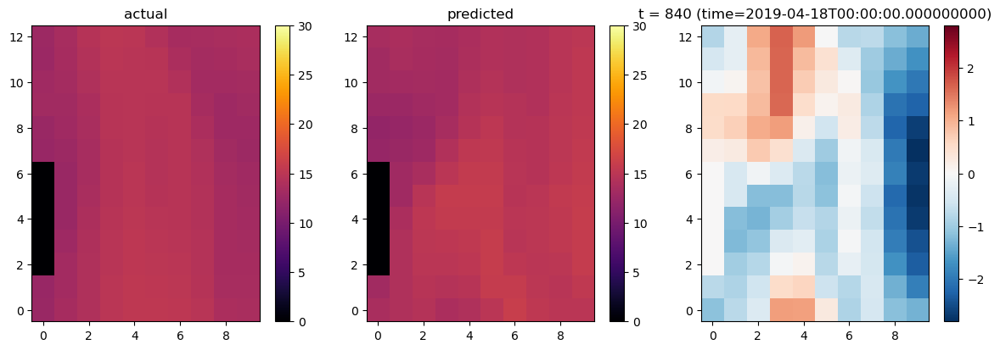


>>> t index = 864, time = 2019-04-21T00:00:00.000000000


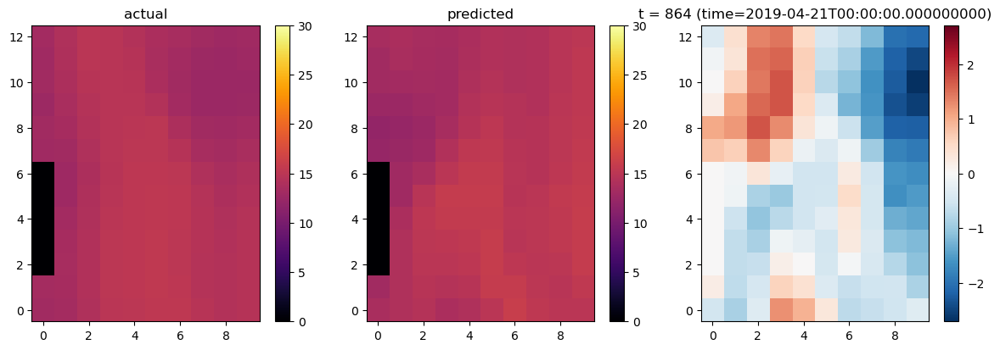


>>> t index = 888, time = 2019-04-24T00:00:00.000000000


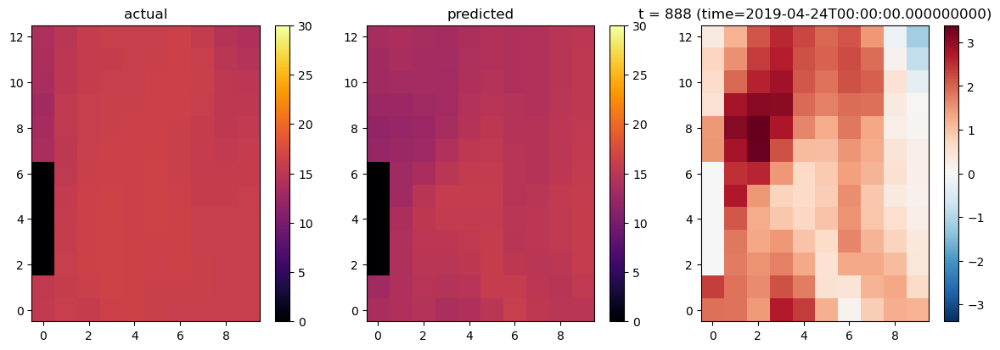


>>> t index = 912, time = 2019-04-27T00:00:00.000000000


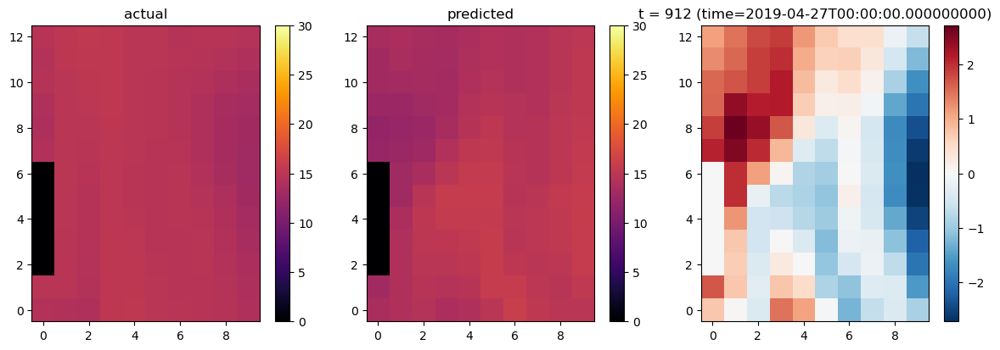


>>> t index = 936, time = 2019-04-30T00:00:00.000000000


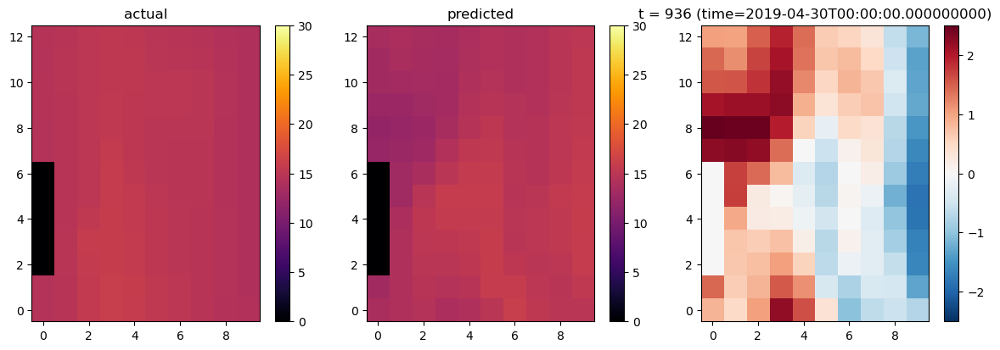


>>> t index = 960, time = 2019-05-03T00:00:00.000000000


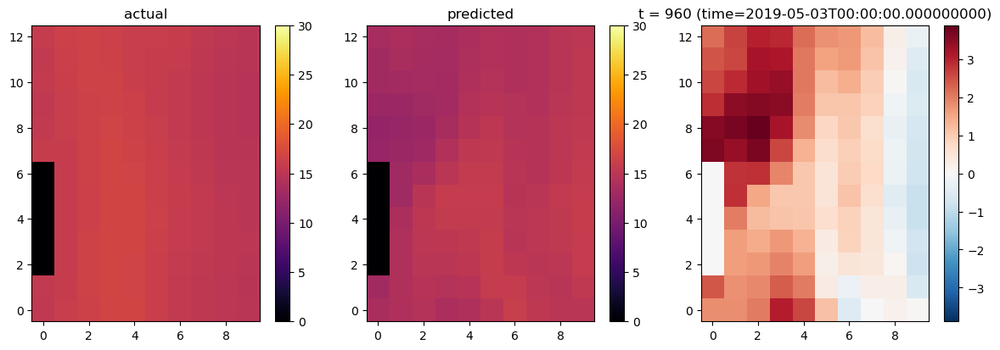


>>> t index = 984, time = 2019-05-06T03:00:00.000000000


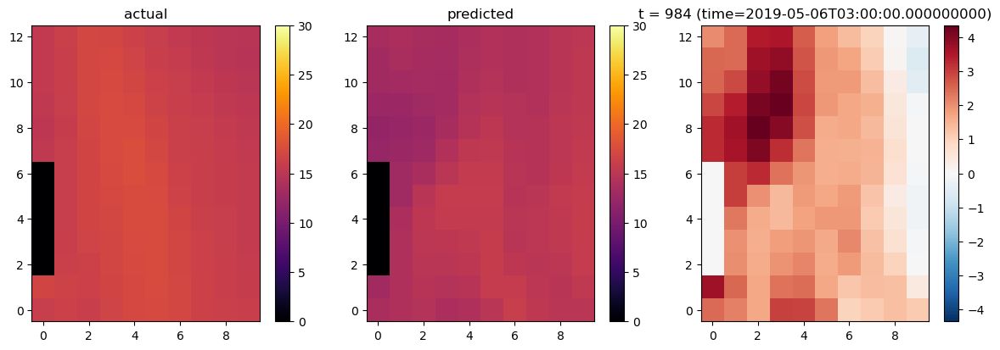


>>> t index = 1008, time = 2019-05-09T03:00:00.000000000


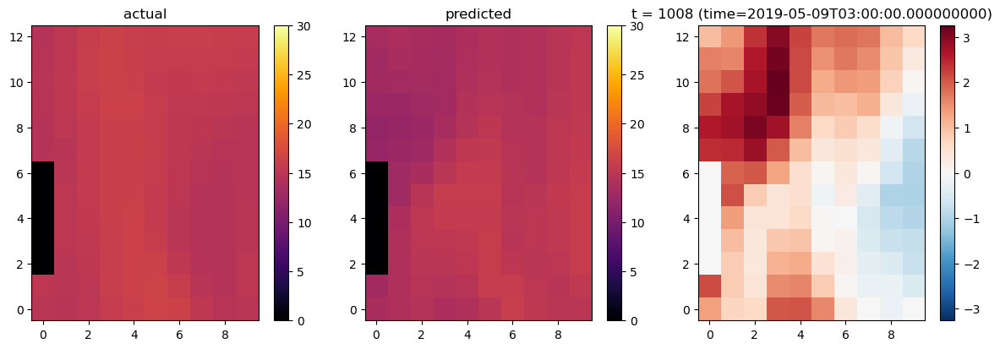


>>> t index = 1032, time = 2019-05-12T09:00:00.000000000


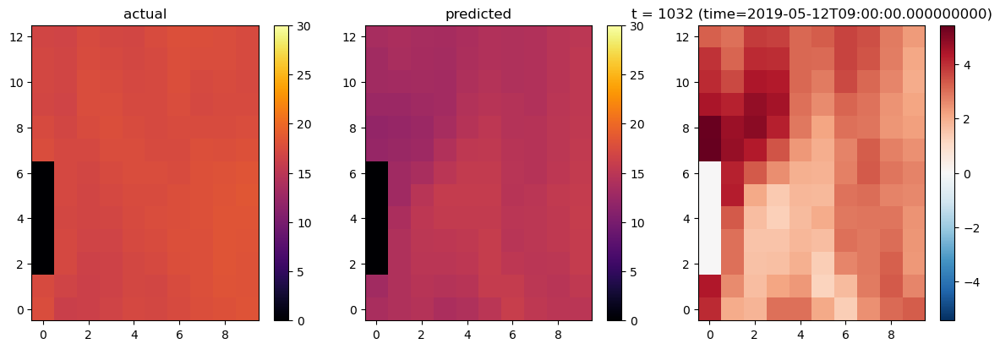


>>> t index = 1056, time = 2019-05-15T09:00:00.000000000


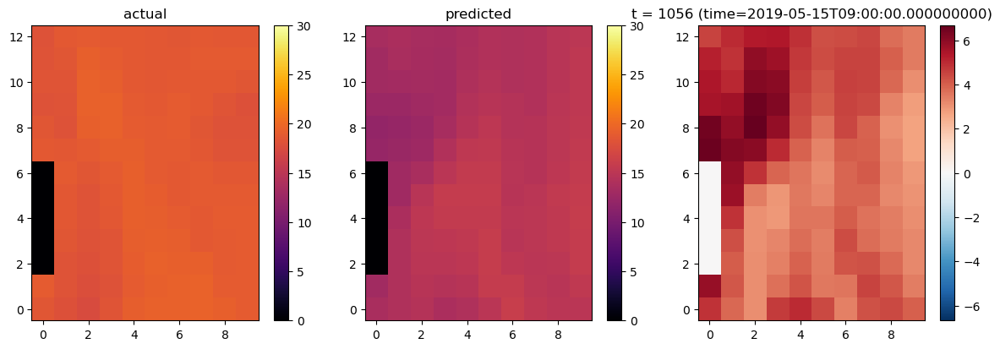


>>> t index = 1080, time = 2019-05-18T09:00:00.000000000


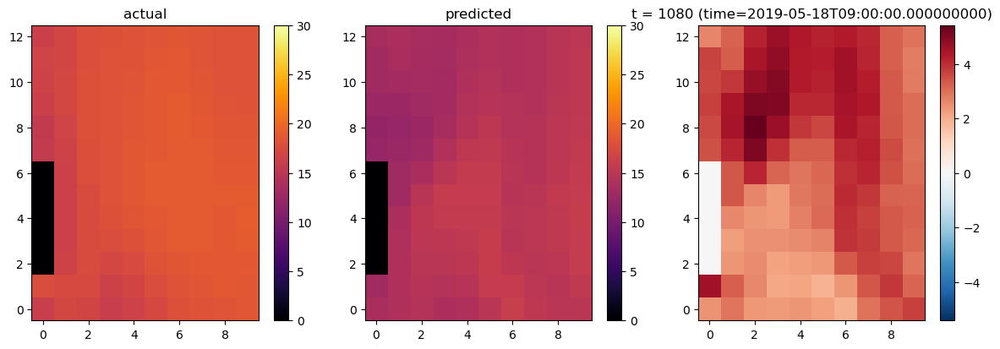


>>> t index = 1104, time = 2019-05-21T09:00:00.000000000


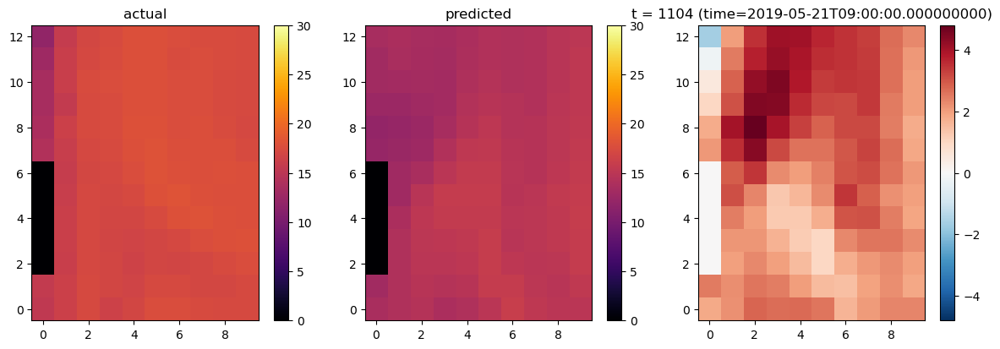


>>> t index = 1128, time = 2019-05-24T09:00:00.000000000


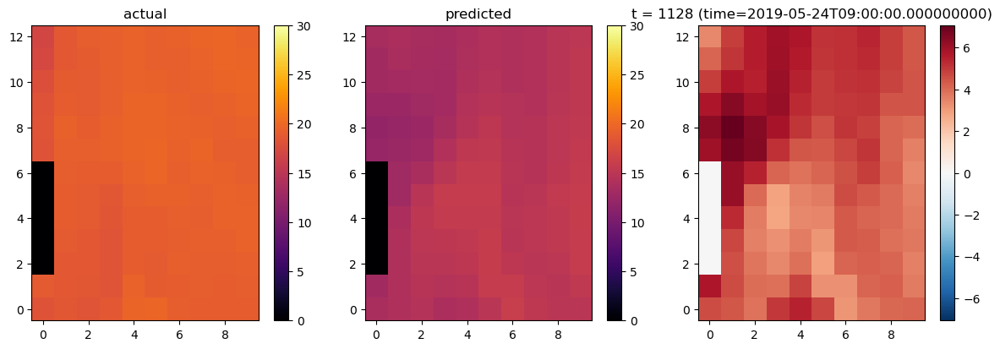


>>> t index = 1152, time = 2019-05-27T09:00:00.000000000


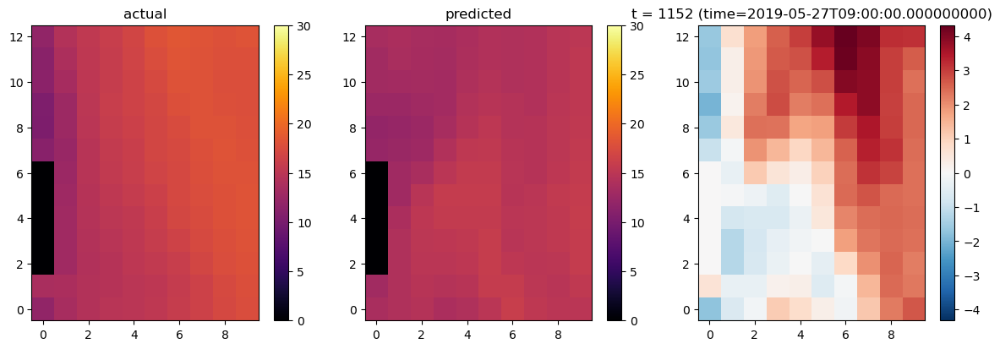


>>> t index = 1176, time = 2019-05-30T09:00:00.000000000


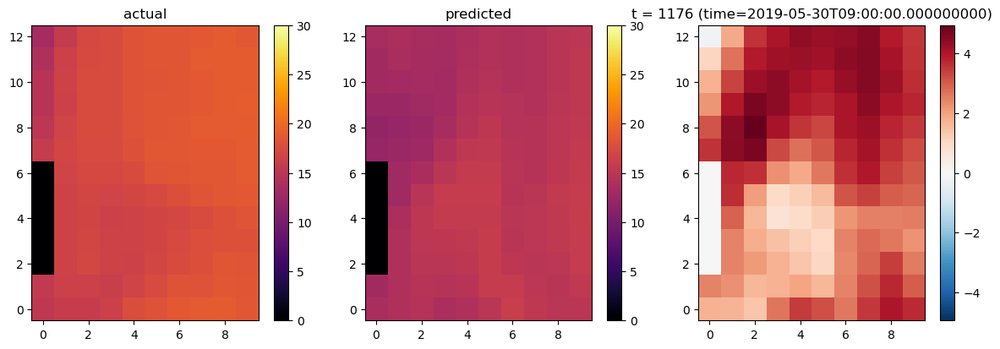


>>> t index = 1200, time = 2019-06-02T09:00:00.000000000


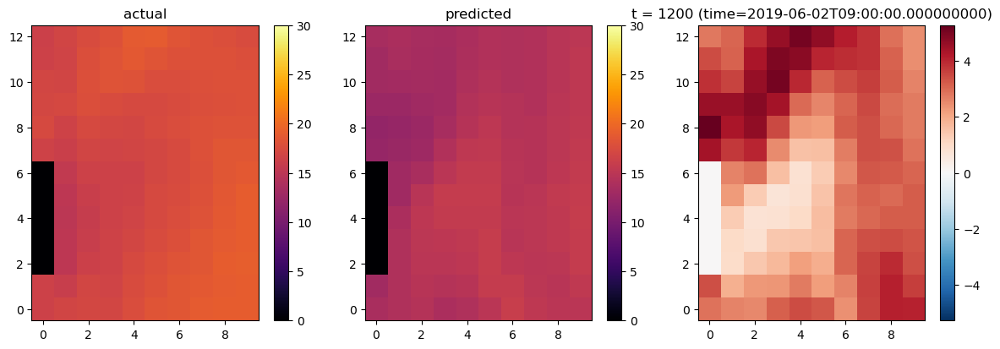


>>> t index = 1224, time = 2019-06-05T09:00:00.000000000


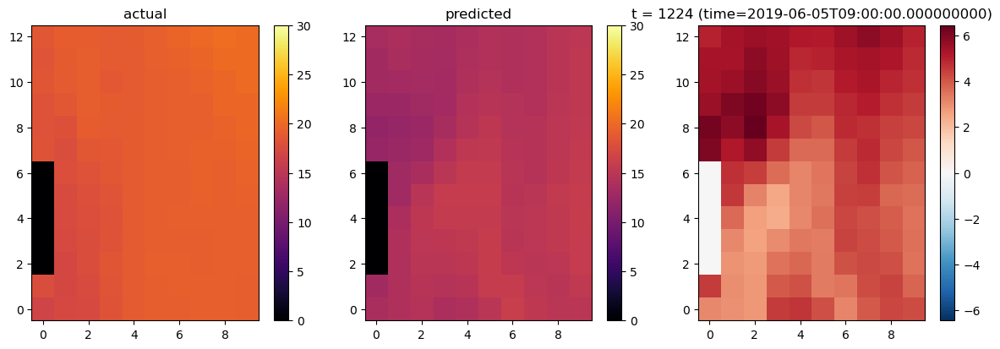


>>> t index = 1248, time = 2019-06-08T09:00:00.000000000


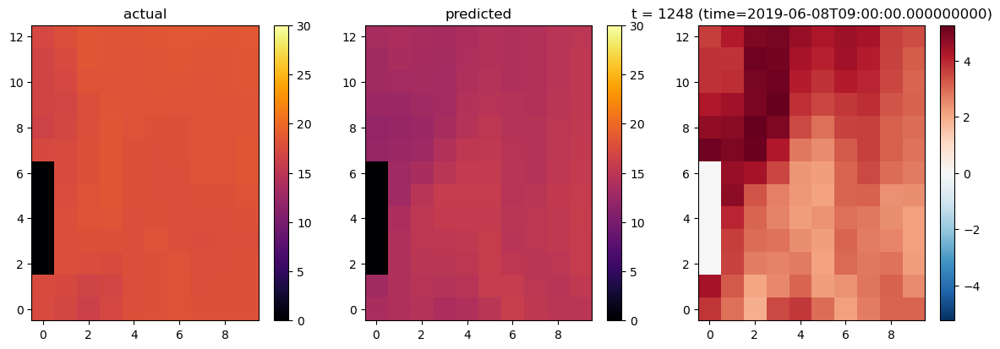


>>> t index = 1272, time = 2019-06-11T09:00:00.000000000


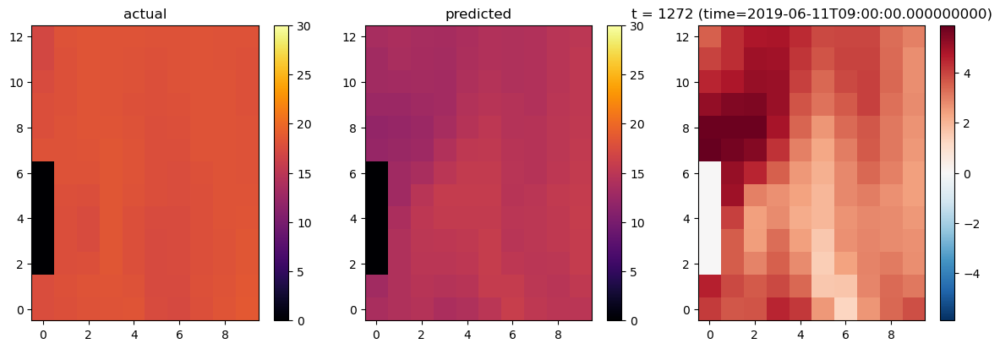


>>> t index = 1296, time = 2019-06-14T09:00:00.000000000


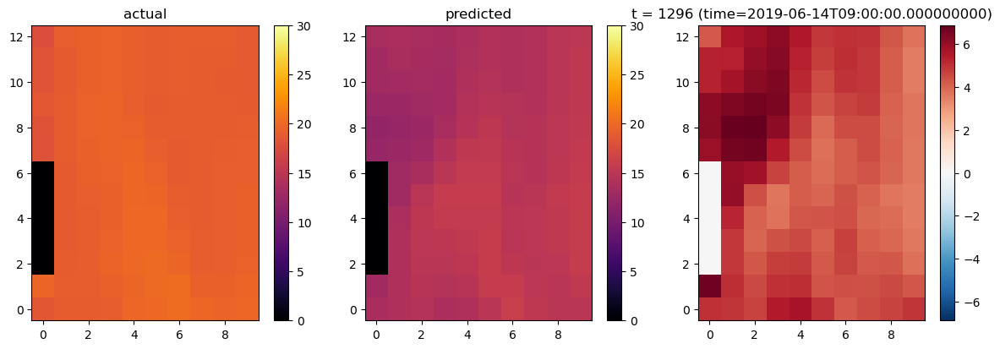


>>> t index = 1320, time = 2019-06-18T09:00:00.000000000


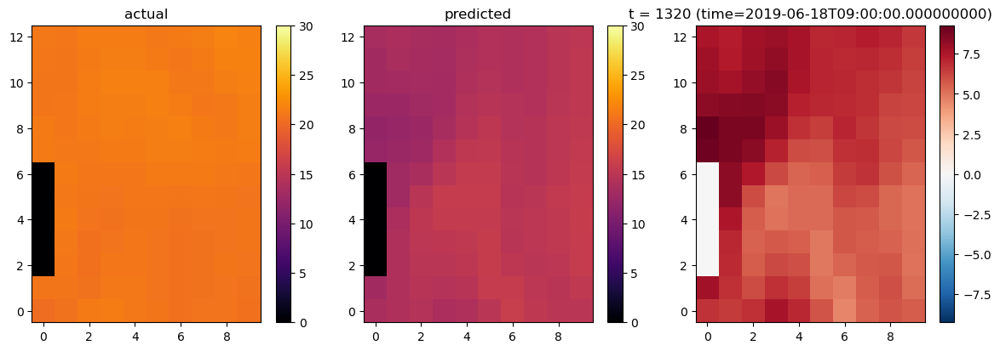


>>> t index = 1344, time = 2019-06-21T09:00:00.000000000


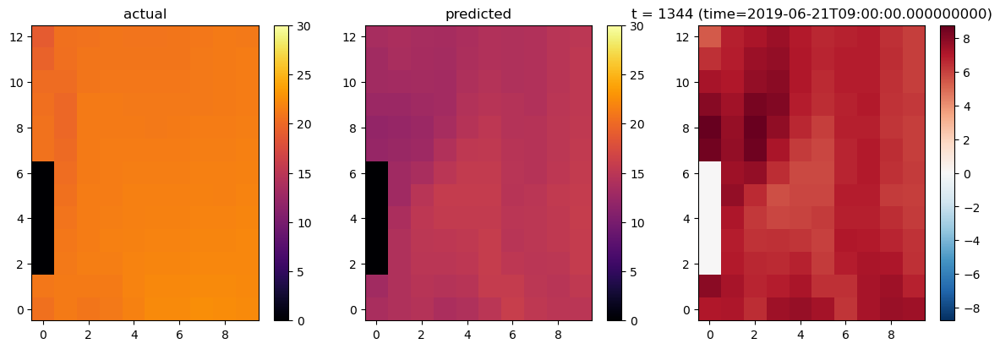


>>> t index = 1368, time = 2019-06-24T09:00:00.000000000


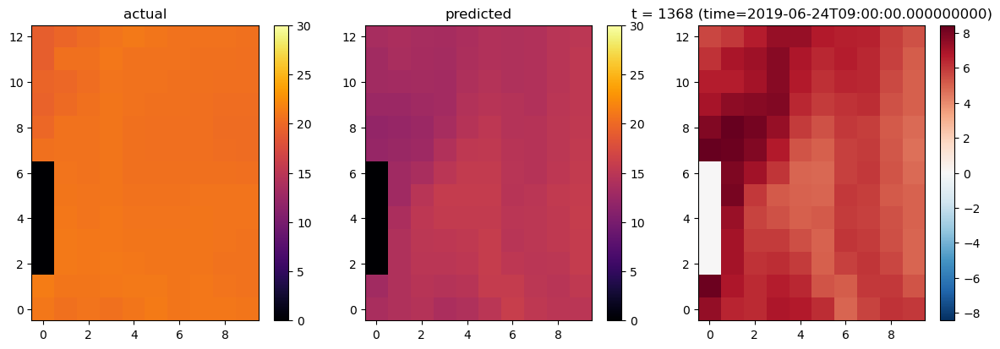


>>> t index = 1392, time = 2019-06-27T09:00:00.000000000


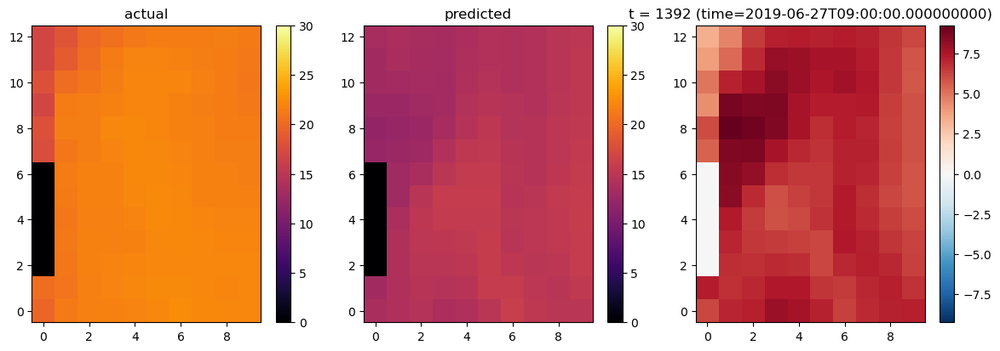


>>> t index = 1416, time = 2019-06-30T09:00:00.000000000


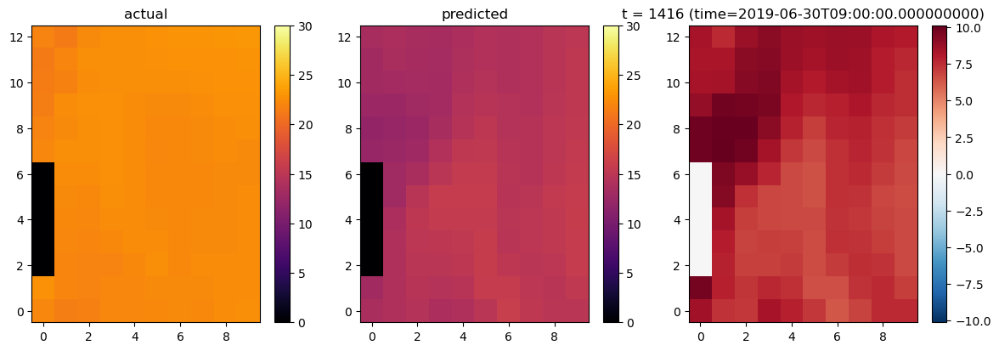


>>> t index = 1440, time = 2019-07-03T09:00:00.000000000


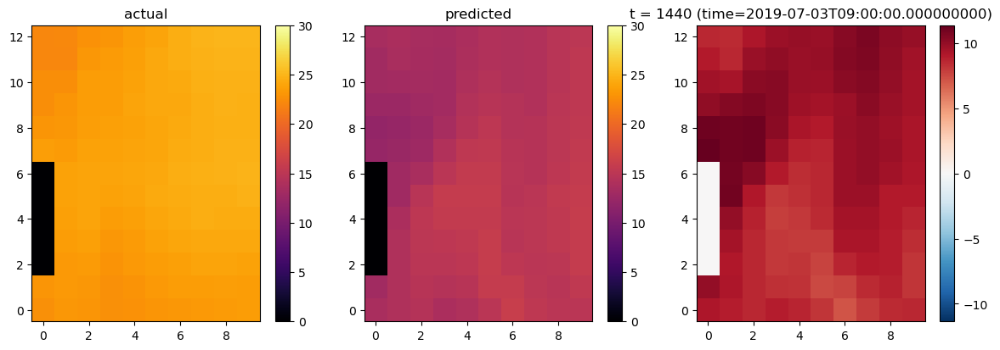


>>> t index = 1464, time = 2019-07-06T09:00:00.000000000


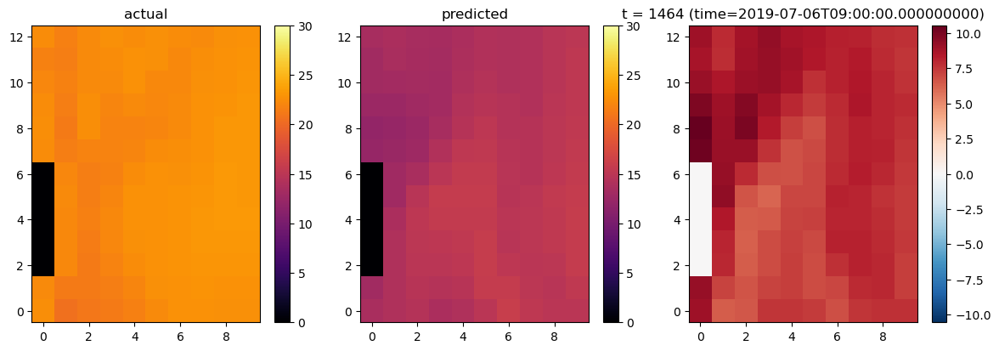


>>> t index = 1488, time = 2019-07-09T09:00:00.000000000


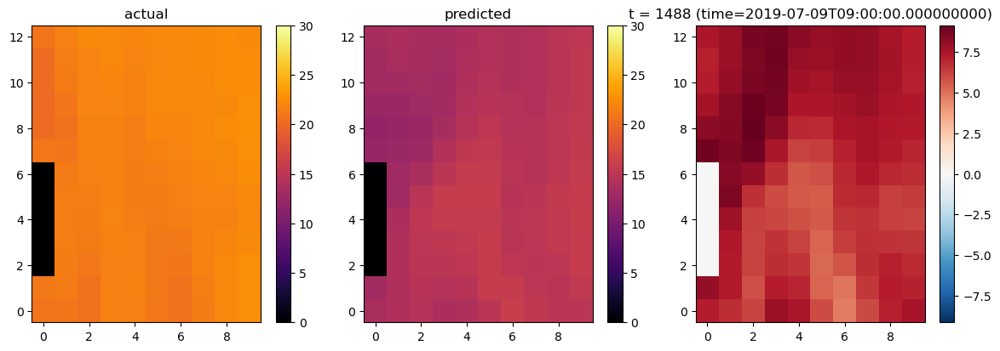


>>> t index = 1512, time = 2019-07-12T09:00:00.000000000


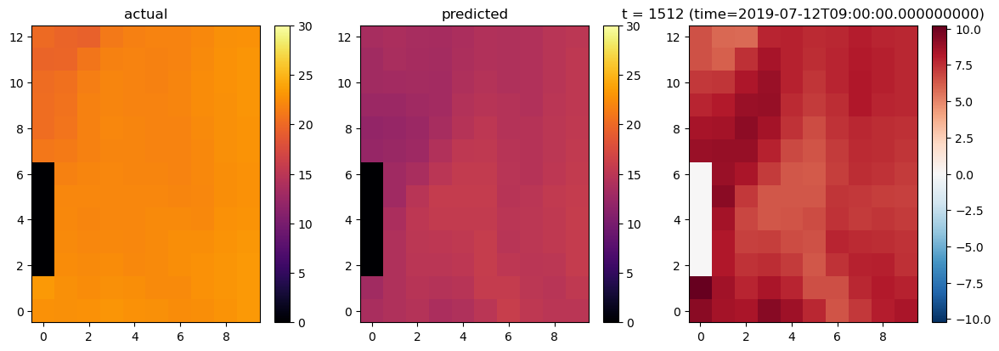


>>> t index = 1536, time = 2019-07-15T09:00:00.000000000


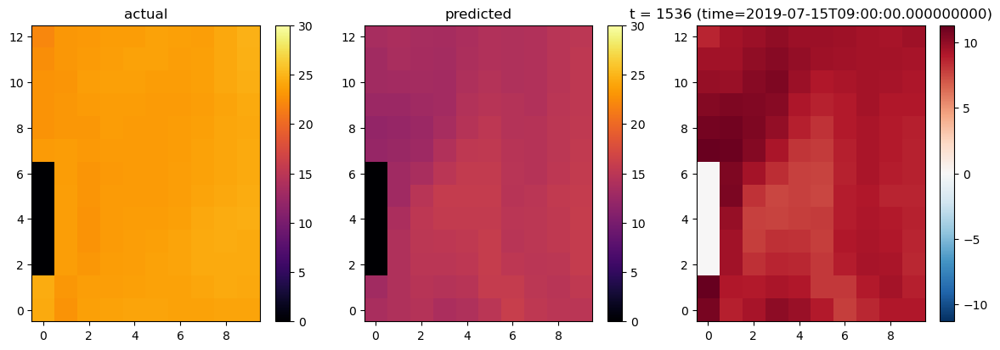


>>> t index = 1560, time = 2019-07-18T09:00:00.000000000


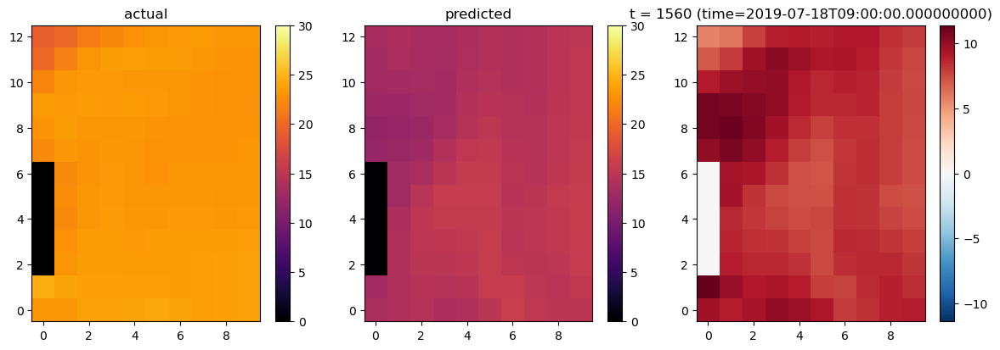


>>> t index = 1584, time = 2019-07-21T09:00:00.000000000


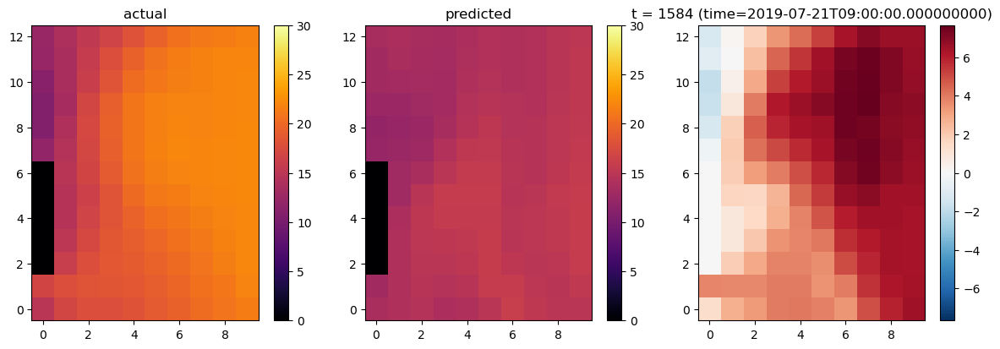


>>> t index = 1608, time = 2019-07-24T09:00:00.000000000


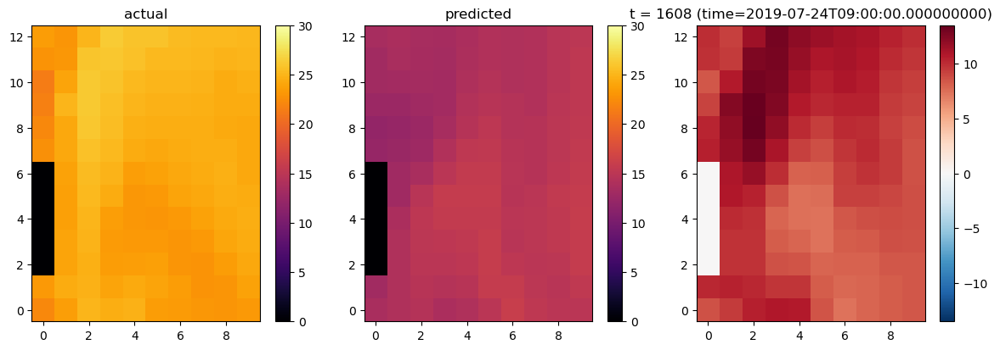


>>> t index = 1632, time = 2019-07-27T09:00:00.000000000


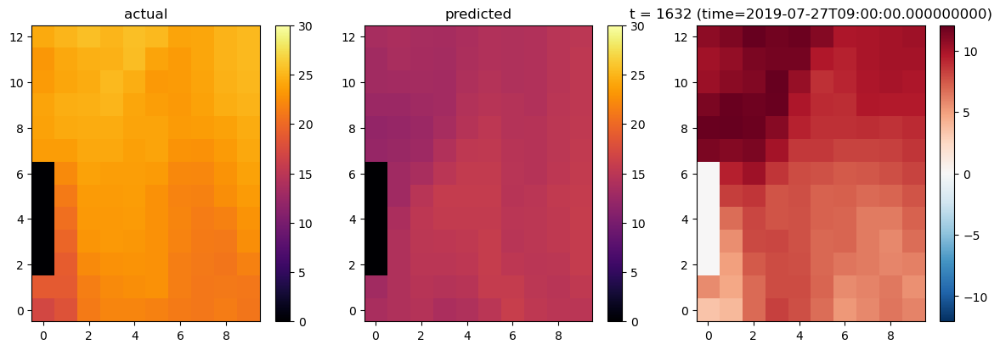


>>> t index = 1656, time = 2019-07-30T09:00:00.000000000


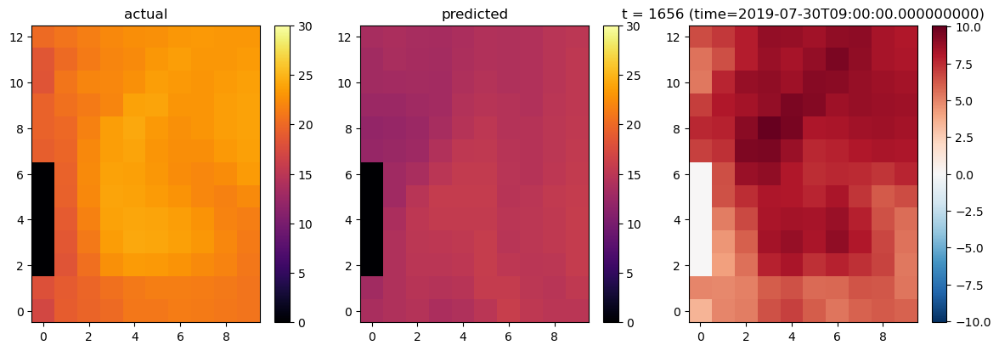


>>> t index = 1680, time = 2019-08-02T09:00:00.000000000


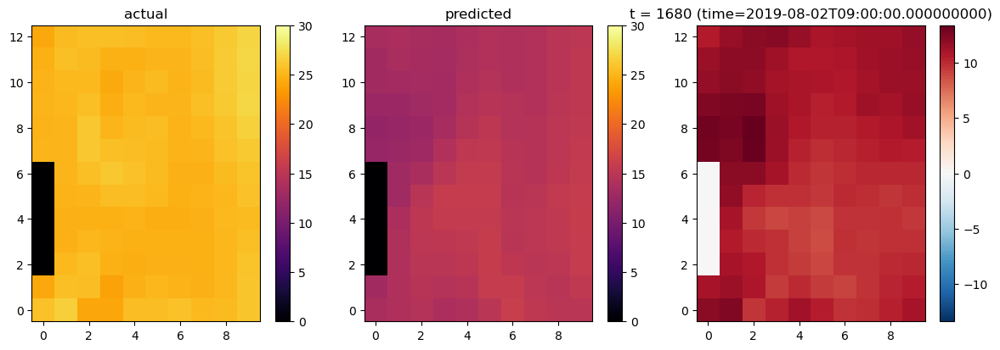


>>> t index = 1704, time = 2019-08-05T09:00:00.000000000


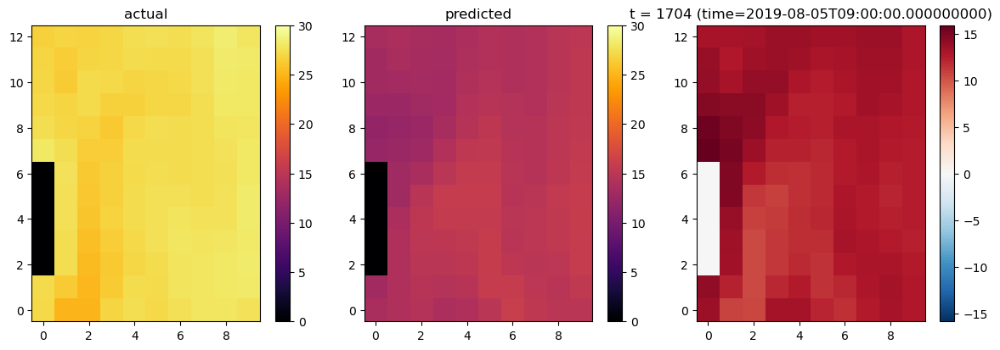


>>> t index = 1728, time = 2019-08-08T09:00:00.000000000


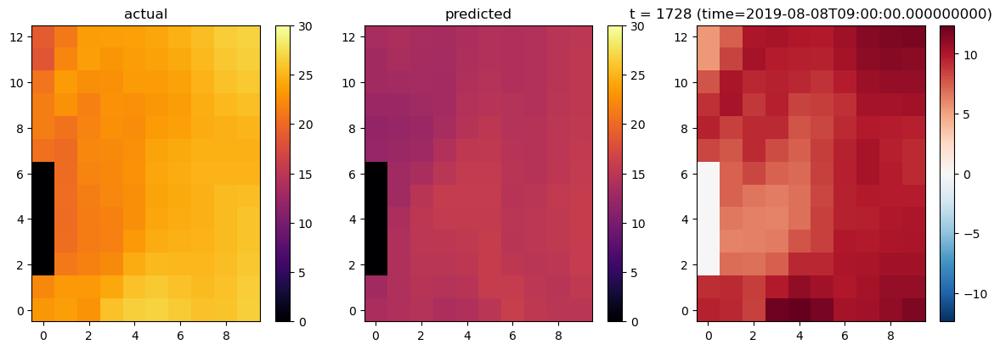


>>> t index = 1752, time = 2019-08-11T09:00:00.000000000


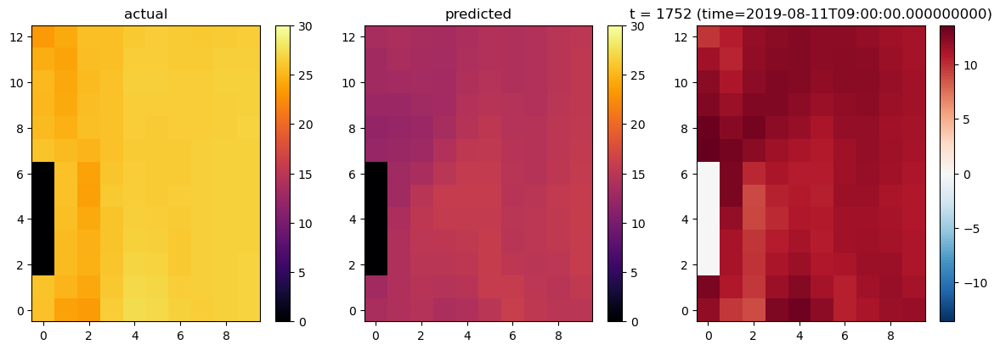


>>> t index = 1776, time = 2019-08-14T09:00:00.000000000


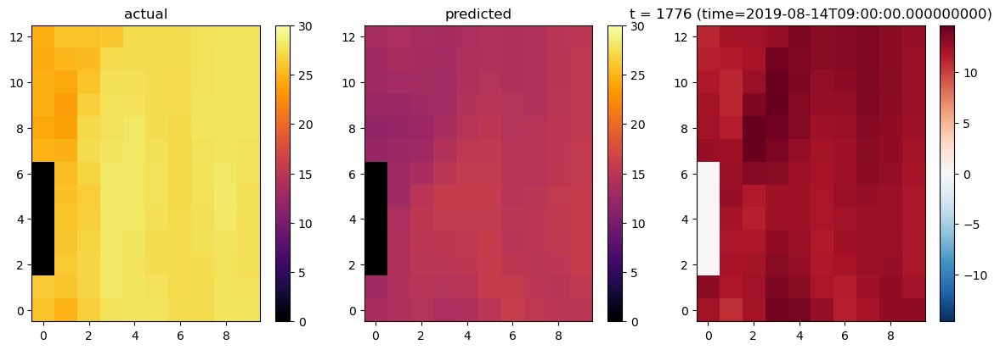


>>> t index = 1800, time = 2019-08-17T09:00:00.000000000


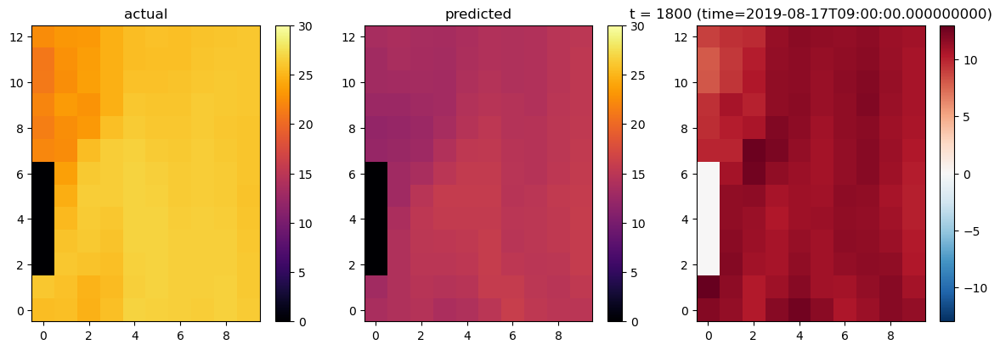


>>> t index = 1824, time = 2019-08-20T09:00:00.000000000


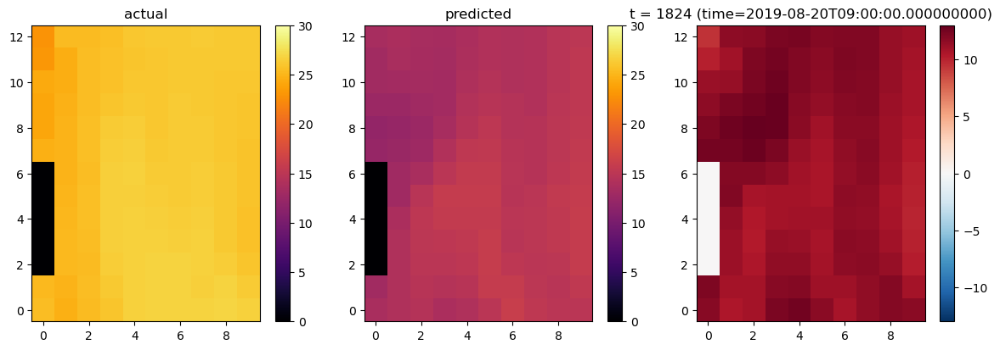


>>> t index = 1848, time = 2019-08-23T09:00:00.000000000


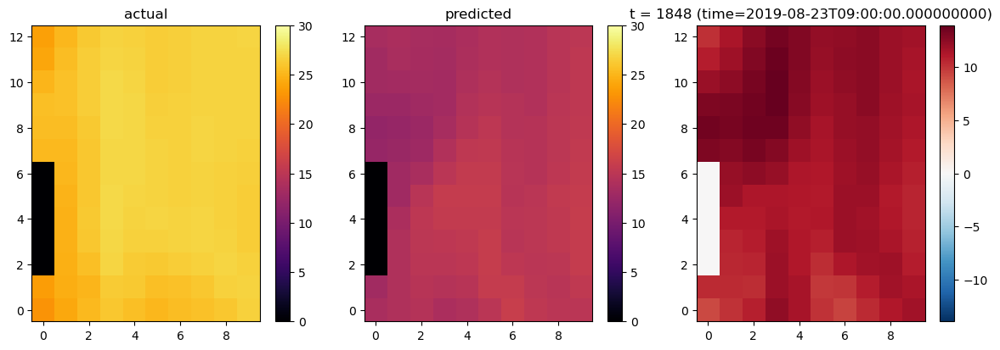


>>> t index = 1872, time = 2019-08-26T09:00:00.000000000


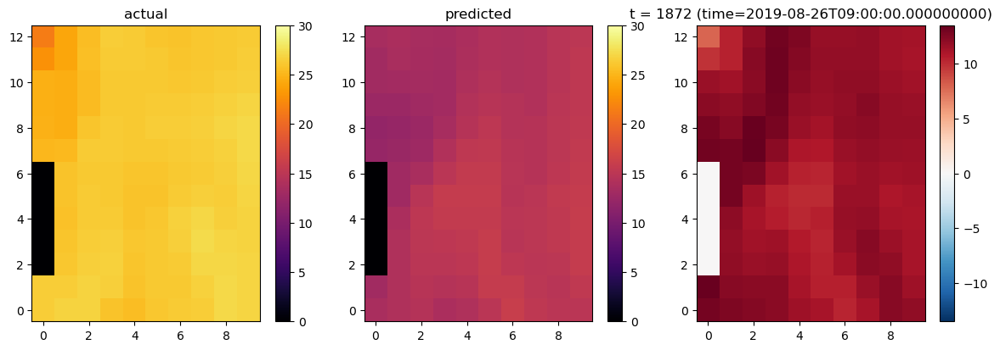


>>> t index = 1896, time = 2019-08-29T09:00:00.000000000


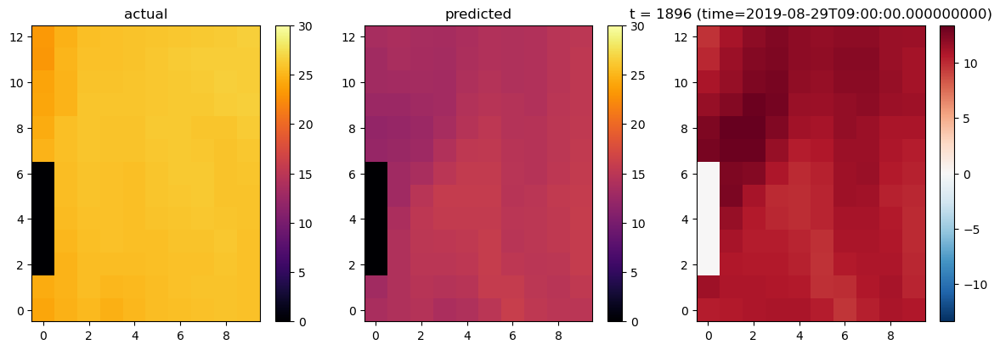


>>> t index = 1920, time = 2019-09-01T09:00:00.000000000


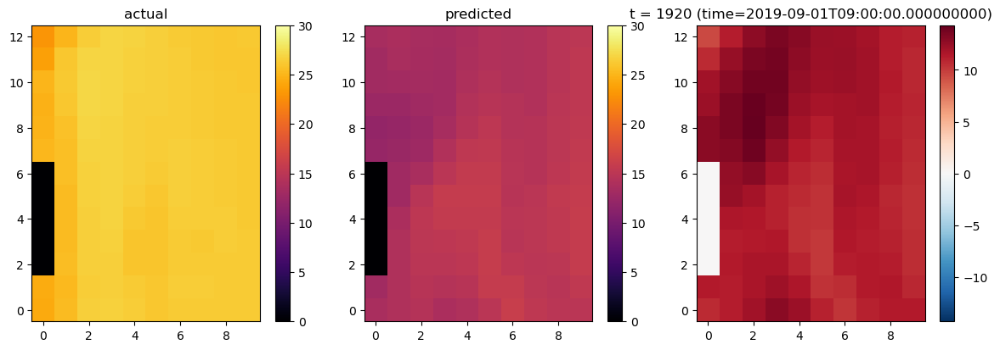


>>> t index = 1944, time = 2019-09-04T09:00:00.000000000


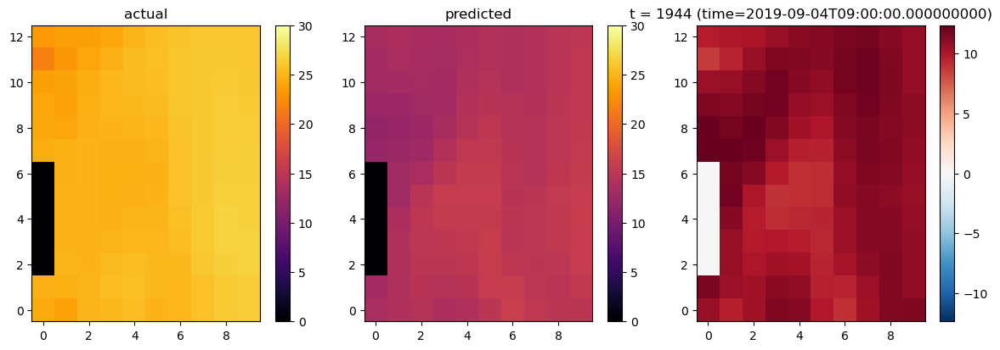


>>> t index = 1968, time = 2019-09-07T09:00:00.000000000


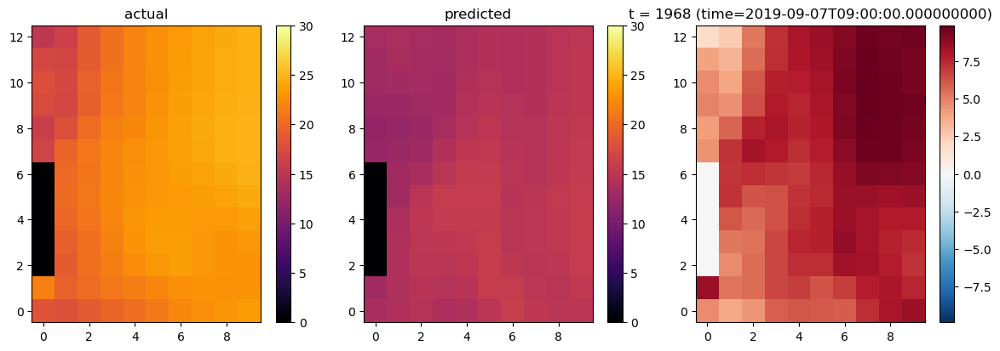


>>> t index = 1992, time = 2019-09-10T09:00:00.000000000


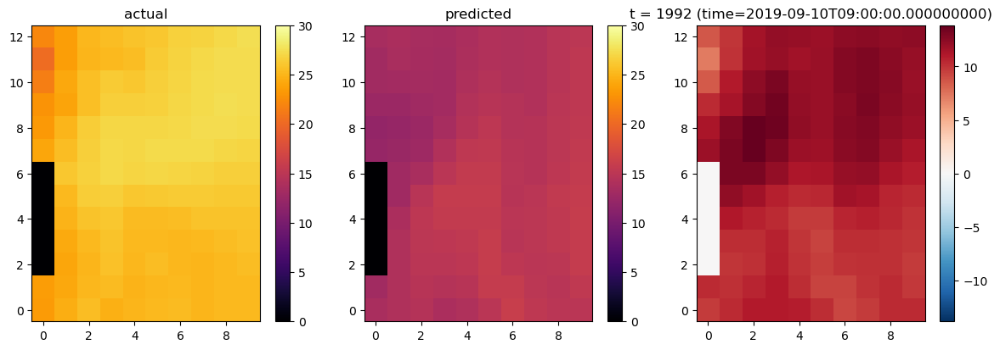


>>> t index = 2016, time = 2019-09-13T09:00:00.000000000


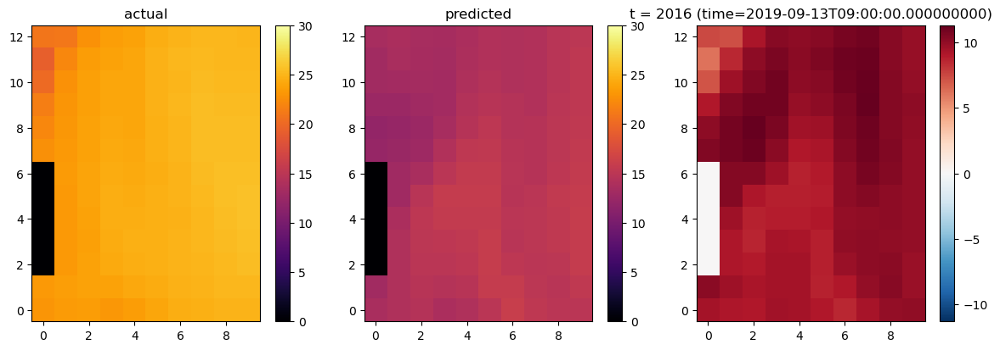


>>> t index = 2040, time = 2019-09-16T09:00:00.000000000


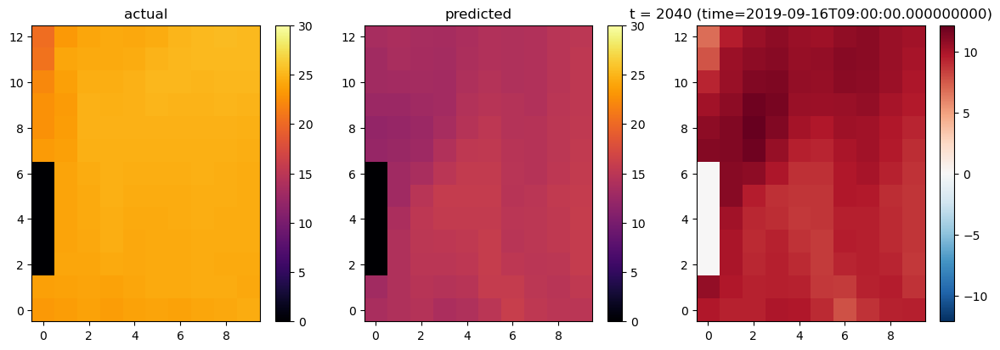


>>> t index = 2064, time = 2019-09-19T09:00:00.000000000


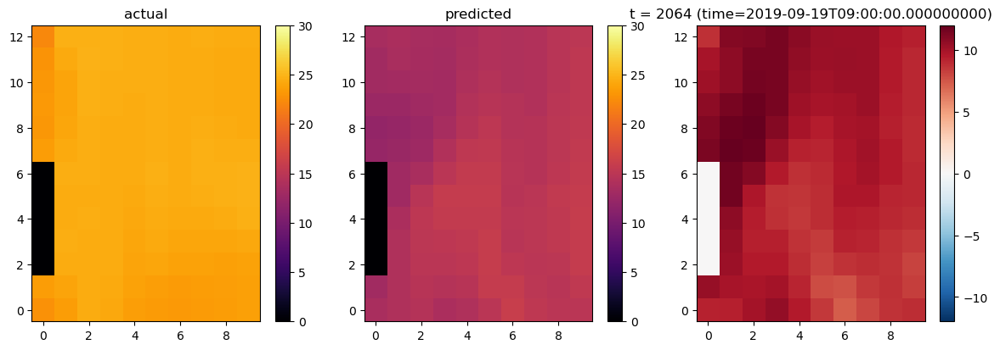


>>> t index = 2088, time = 2019-09-22T09:00:00.000000000


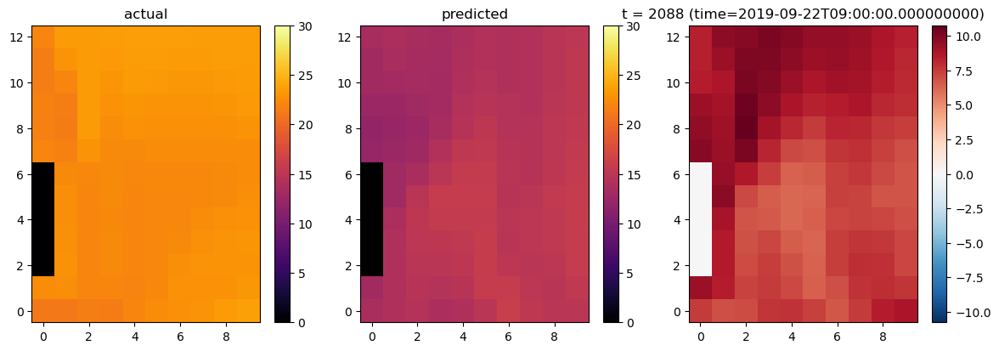


>>> t index = 2112, time = 2019-09-25T09:00:00.000000000


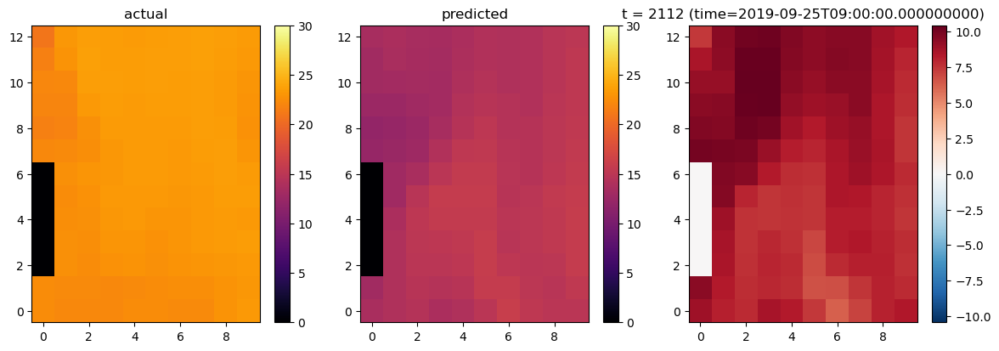


>>> t index = 2136, time = 2019-09-28T09:00:00.000000000


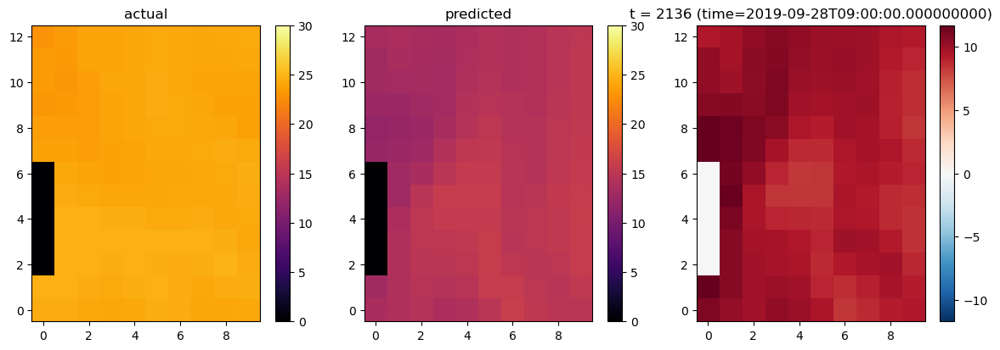


>>> t index = 2160, time = 2019-10-01T09:00:00.000000000


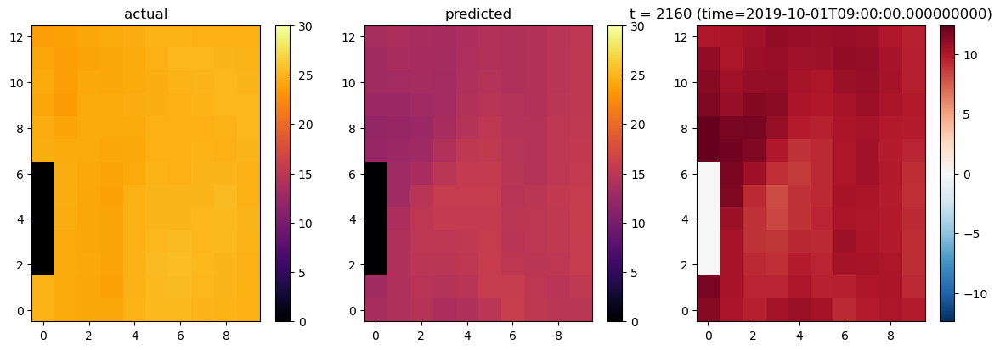


>>> t index = 2184, time = 2019-10-05T09:00:00.000000000


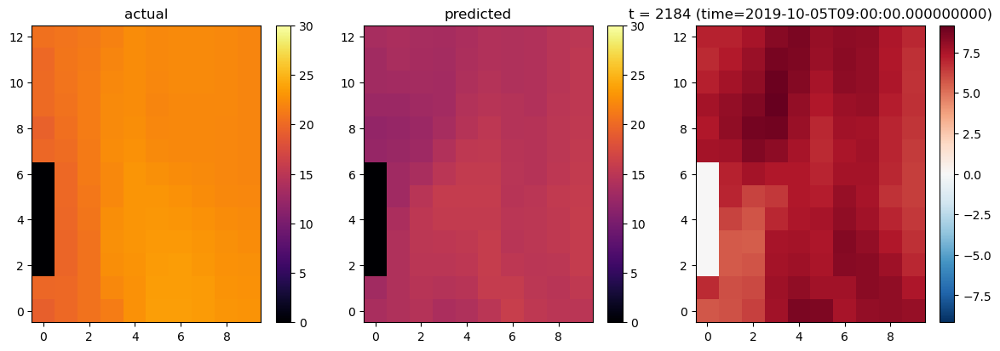


>>> t index = 2208, time = 2019-10-08T09:00:00.000000000


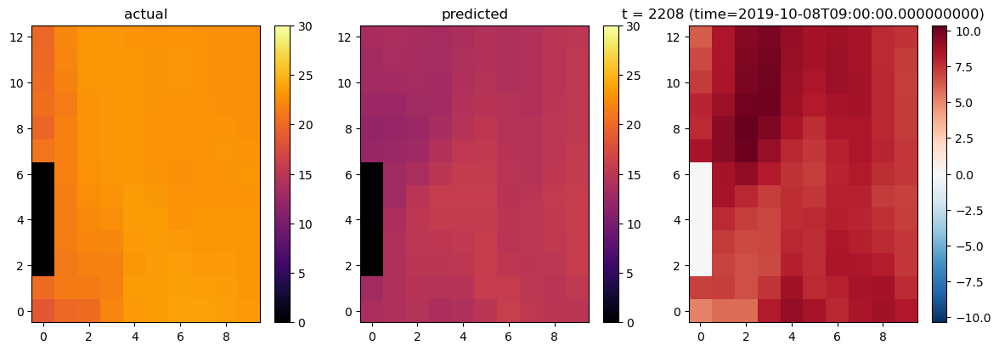


>>> t index = 2232, time = 2019-10-11T09:00:00.000000000


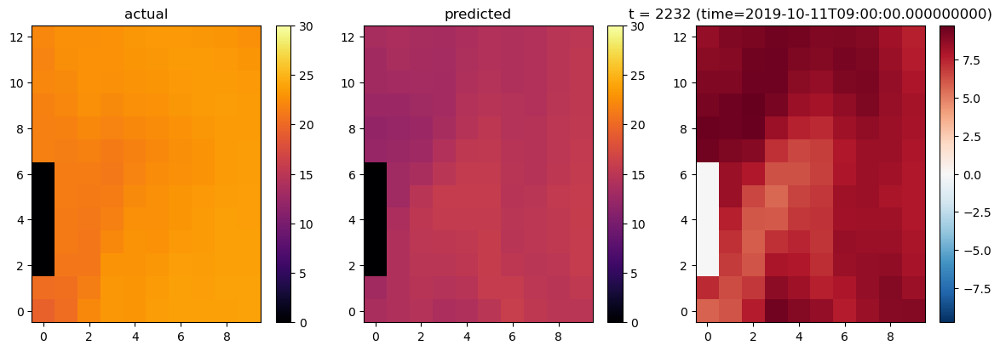


>>> t index = 2256, time = 2019-10-14T09:00:00.000000000


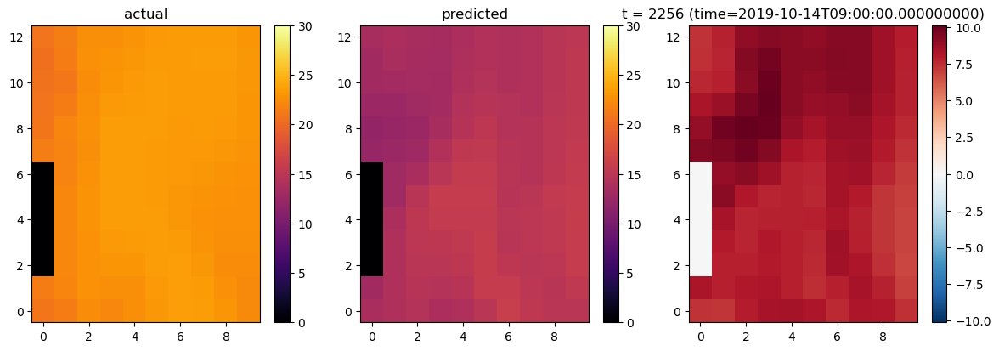


>>> t index = 2280, time = 2019-10-17T09:00:00.000000000


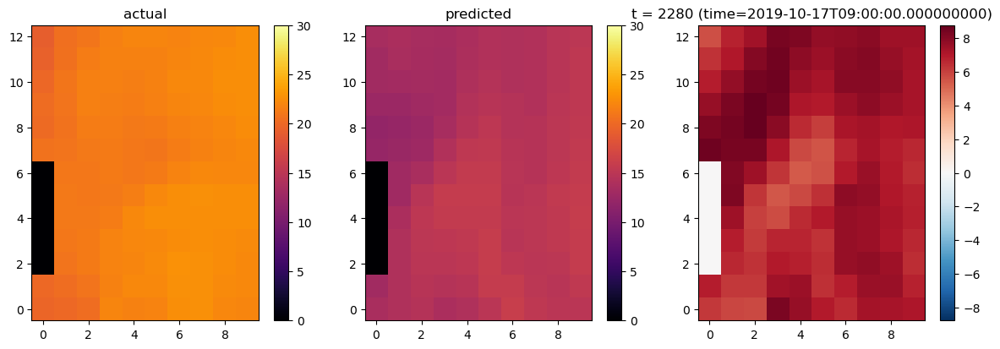


>>> t index = 2304, time = 2019-10-20T09:00:00.000000000


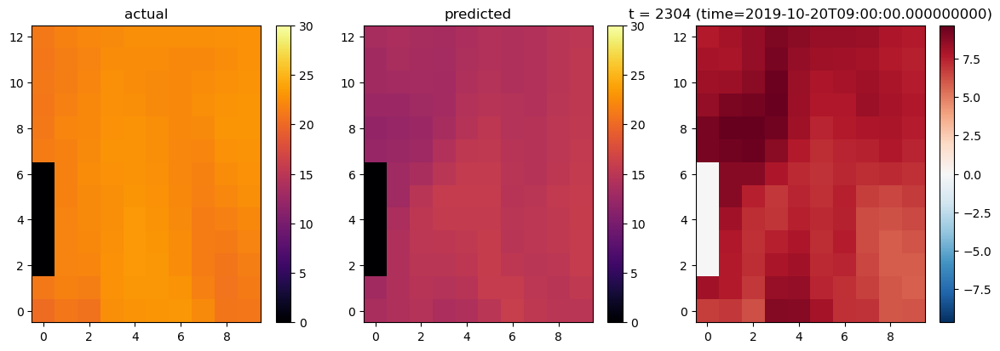


>>> t index = 2328, time = 2019-10-23T09:00:00.000000000


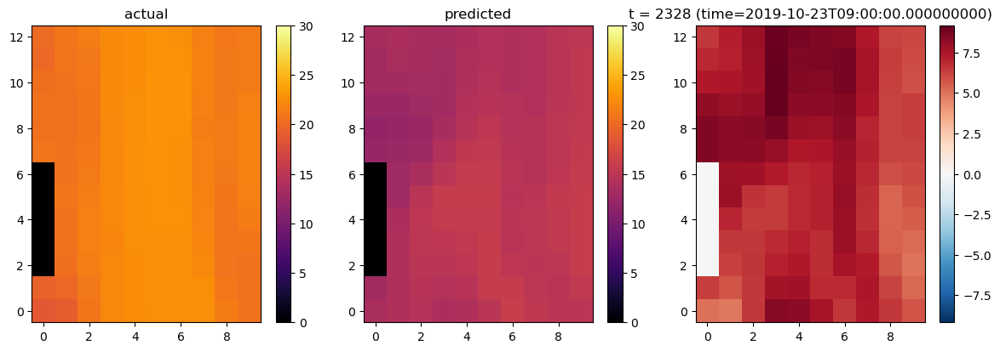


>>> t index = 2352, time = 2019-10-26T09:00:00.000000000


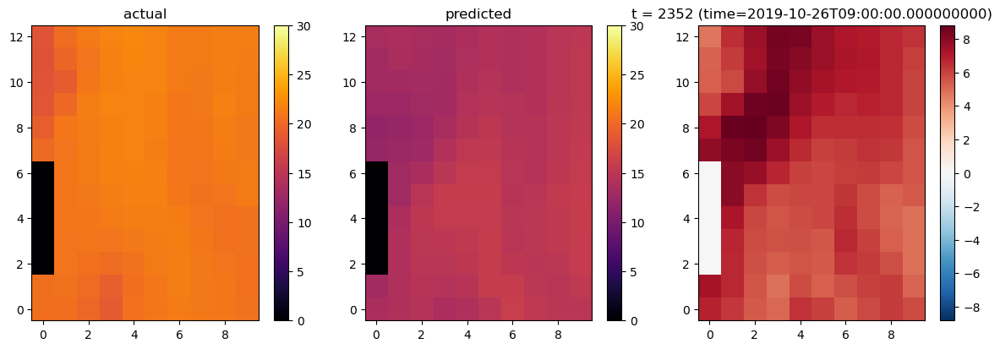


>>> t index = 2376, time = 2019-10-29T09:00:00.000000000


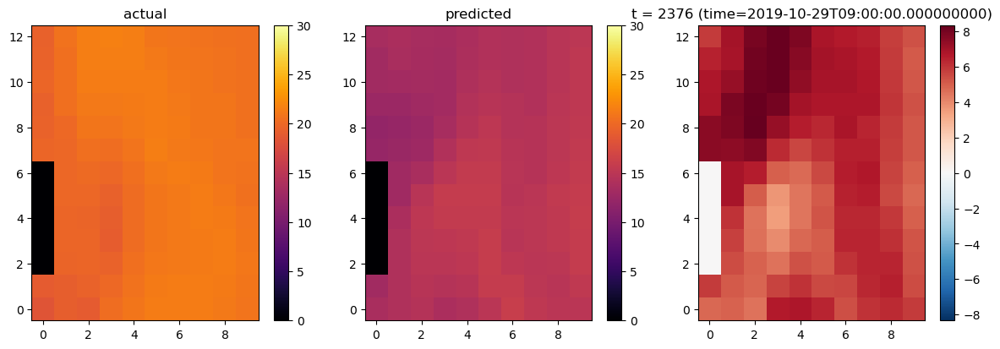

In [11]:
step = 24
for ti in range(0, 2400, step):
    print(f"\n>>> t index = {ti}, time = {T_test[ti]}")
    plot_frame(ti, stride_y=1, stride_x=1)


In [12]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# --------------------------
# 1) 사용할 frame index 정의
# --------------------------
step = 24  # 24시간 간격처럼 보고 싶을 때
max_t = min(36500, nTest)  # 너가 쓰던 0~2400 구간
frames = list(range(0, max_t, step))

print("총 프레임 수:", len(frames))

# --------------------------
# 2) 색 범위 미리 결정 (깜빡임 방지)
# --------------------------
# temp 색 범위 (0~30도 정도, 필요하면 조정)
vmin, vmax = 0, 30

# residual 범위 (전 test 구간에서 최대 절대값)
resid_all = test - pred
maxabs = np.nanmax(np.abs(resid_all))
vmin_r, vmax_r = -maxabs, maxabs

# --------------------------
# 3) figure / axes / 초기 이미지 생성
# --------------------------
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# 초기 시점은 첫 프레임
ti0 = frames[0]
a0 = test[:, :, ti0]
p0 = pred[:, :, ti0]
r0 = a0 - p0

cmap_temp = plt.cm.inferno
cmap_res  = plt.cm.RdBu_r

im0 = axes[0].imshow(a0, origin="lower", aspect="equal",
                     cmap=cmap_temp, vmin=vmin, vmax=vmax)
axes[0].set_title(f"actual @ {T_test[ti0]}")
cbar0 = fig.colorbar(im0, ax=axes[0])

im1 = axes[1].imshow(p0, origin="lower", aspect="equal",
                     cmap=cmap_temp, vmin=vmin, vmax=vmax)
axes[1].set_title("predicted")
cbar1 = fig.colorbar(im1, ax=axes[1])

im2 = axes[2].imshow(r0, origin="lower", aspect="equal",
                     cmap=cmap_res, vmin=vmin_r, vmax=vmax_r)
axes[2].set_title("residual")
cbar2 = fig.colorbar(im2, ax=axes[2])

plt.tight_layout()

# --------------------------
# 4) 업데이트 함수 정의
# --------------------------
def update(frame_idx):
    ti = frames[frame_idx]
    a = test[:, :, ti]
    p = pred[:, :, ti]
    r = a - p

    im0.set_data(a)
    im1.set_data(p)
    im2.set_data(r)

    axes[0].set_title(f"actual @ {T_test[ti]}")
    axes[2].set_title(f"residual @ {T_test[ti]}")

    return [im0, im1, im2]

# --------------------------
# 5) 애니메이션 생성
# --------------------------
ani = FuncAnimation(
    fig,
    update,
    frames=len(frames),
    interval=300,   # ms 단위. 300이면 0.3초마다 한 프레임
    blit=False
)

plt.close(fig)  # 중복 출력 방지
HTML(ani.to_jshtml())


총 프레임 수: 131


In [13]:
from matplotlib.animation import PillowWriter

gif_path = "xbt_arima_section.gif"
ani.save(gif_path, writer=PillowWriter(fps=4))
print("저장 완료:", gif_path)


저장 완료: xbt_arima_section.gif


## 7일 -> 다음 1step 예측 

In [24]:
from statsmodels.tsa.arima.model import ARIMA

ARIMA_ORDER = (1, 1, 1)

# pred_1step: test와 동일 shape (nY2, nX2, nTest)
pred_1step = np.zeros_like(test, dtype=float)

_, _, nT = tnsr_ds.shape
first_test_idx = cut_trng + 1  # global index에서 test 시작
last_idx = nT - 1

print("nT:", nT)
print("train length:", cut_trng+1)
print("test length:", nTest)
print("test global index:", first_test_idx, "~", last_idx)

for i in range(nY2):
    for j in range(nX2):
        # 이 격자의 전체 시계열 (train+test)
        series = tnsr_ds[i, j, :].astype(float)

        # 전부 0이거나 NaN이면 그냥 0 예측
        if np.allclose(series, 0) or np.all(np.isnan(series)):
            continue

        s = pd.Series(series)
        s = s.replace([np.inf, -np.inf], np.nan).interpolate(limit_direction="both")

        try:
            # ⚠ 여기서는 전체 시계열(s.values)을 가지고 ARIMA 한 번만 피팅
            model = ARIMA(
                s.values,
                order=ARIMA_ORDER,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            res = model.fit()

            # cut_trng+1 ~ nT-1 구간에 대한 1-step ahead 예측
            # statsmodels의 predict(start,end, dynamic=False)는
            # 각 시점에서 그 이전까지의 관측값을 사용한 1-step 예측
            fc = res.predict(start=first_test_idx, end=last_idx, dynamic=False)

            # fc 길이는 nTest와 같아야 함
            if len(fc) != nTest:
                # 혹시 길이가 미묘하게 다르면 잘라서 맞추기
                fc = fc[:nTest]

            pred_1step[i, j, :] = fc

        except Exception as e:
            # 문제가 생기면 train 마지막 값으로 평탄 예측
            last_train_val = s.values[cut_trng]
            pred_1step[i, j, :] = last_train_val

print("pred_1step shape:", pred_1step.shape)


nT: 8883
train length: 5758
test length: 3125
test global index: 5758 ~ 8882


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


pred_1step shape: (13, 10, 3125)


In [25]:
# ============================================
# 4-B. 장기예측 (7일 / 30일)
# ============================================

horizons = [7, 30]   # 7일, 30일 ahead
pred_h = {}          # pred_h[7], pred_h[30] 형태

for H in horizons:
    pred_h[H] = np.zeros((nY2, nX2, H), dtype=float)

print("\n### 장기예측 시작 ###")

for i in range(nY2):
    for j in range(nX2):

        # 전체 시계열 중 train만 사용
        series = tnsr_ds[i, j, :cut_trng+1].astype(float)

        if np.allclose(series, 0) or np.all(np.isnan(series)):
            continue

        s = pd.Series(series).replace([np.inf, -np.inf], np.nan)
        s = s.interpolate(limit_direction="both")

        try:
            model = ARIMA(
                s.values,
                order=ARIMA_ORDER,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            res = model.fit()

            # H-step forecast
            for H in horizons:
                fc = res.forecast(steps=H)
                pred_h[H][i, j, :] = fc

        except:
            # 실패 → train 마지막 값 복붙
            last_val = s.values[-1]
            for H in horizons:
                pred_h[H][i, j, :] = last_val

print("장기예측 완료.")
for H in horizons:
    print(f"pred_h[{H}].shape =", pred_h[H].shape)



### 장기예측 시작 ###
장기예측 완료.
pred_h[7].shape = (13, 10, 7)
pred_h[30].shape = (13, 10, 30)


1-step ahead 평균 MAE : 0.13559028168942944
1-step ahead 평균 RMSE: 0.16744998939960912


C:\Users\kjhye\AppData\Local\Temp\ipykernel_22968\2301705273.py:20: UserWarning: Glyph 44592 (\N{HANGUL SYLLABLE GI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\kjhye\AppData\Local\Temp\ipykernel_22968\2301705273.py:20: UserWarning: Glyph 44036 (\N{HANGUL SYLLABLE GAN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\kjhye\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 44592 (\N{HANGUL SYLLABLE GI}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\kjhye\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 44036 (\N{HANGUL SYLLABLE GAN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


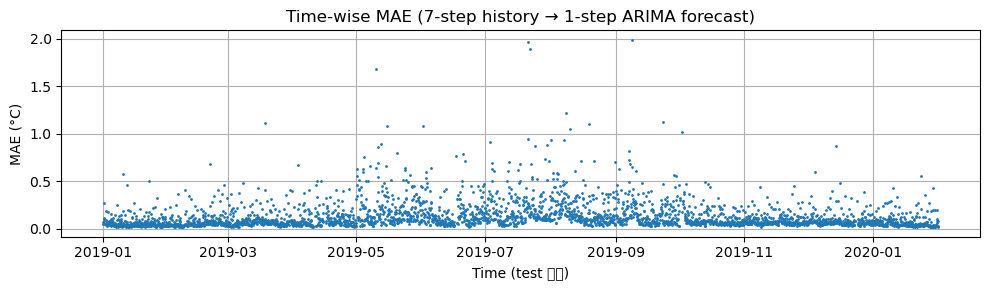

In [26]:
# ============================================
# 5. Metrics (1-step ahead ARIMA, 7-step history)
# ============================================

err = test - pred_1step  # 이제는 1-step ahead 예측 기반

# 각 시간 k마다 (위도/경도 평균) MAE
mae_t = np.nanmean(np.abs(err), axis=(0, 1))
rmse_t = np.sqrt(np.nanmean(err**2, axis=(0, 1)))

print("1-step ahead 평균 MAE :", float(np.nanmean(mae_t)))
print("1-step ahead 평균 RMSE:", float(np.nanmean(rmse_t)))

plt.figure(figsize=(10, 3))
plt.plot(T_test, mae_t, marker=".", linestyle="None", markersize=2)
plt.title("Time-wise MAE (7-step history → 1-step ARIMA forecast)")
plt.xlabel("Time (test 기간)")
plt.ylabel("MAE (°C)")
plt.grid(True)
plt.tight_layout()
plt.show()



=== Horizon 7일 예측 ===
lead 1~H일별 MAE: [0.04502412 0.12513881 0.17349034 0.20124149 0.25701242 0.27633959
 0.31246023]
평균 MAE: 0.19867243138520602


C:\Users\kjhye\AppData\Local\Temp\ipykernel_22968\3404028997.py:17: UserWarning: Glyph 45149 (\N{HANGUL SYLLABLE GGEUT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\kjhye\AppData\Local\Temp\ipykernel_22968\3404028997.py:17: UserWarning: Glyph 50640 (\N{HANGUL SYLLABLE E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\kjhye\AppData\Local\Temp\ipykernel_22968\3404028997.py:17: UserWarning: Glyph 49436 (\N{HANGUL SYLLABLE SEO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\kjhye\AppData\Local\Temp\ipykernel_22968\3404028997.py:17: UserWarning: Glyph 54620 (\N{HANGUL SYLLABLE HAN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\kjhye\AppData\Local\Temp\ipykernel_22968\3404028997.py:17: UserWarning: Glyph 48264 (\N{HANGUL SYLLABLE BEON}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\kjhye\AppData\Local\Temp\ipykernel_22968\3404028997.py:17: UserWarning: Glyph 50696 (\N{HANGUL SYLLABLE YE}) missing fro

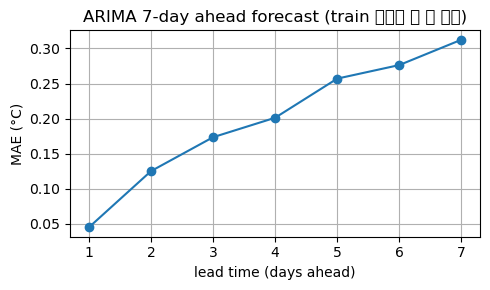


=== Horizon 30일 예측 ===
lead 1~H일별 MAE: [0.04502412 0.12513881 0.17349034 0.20124149 0.25701242 0.27633959
 0.31246023 0.34471178 0.36955455 0.39915862 0.4125121  0.41729851
 0.50093528 0.51724699 0.52067582 0.51881485 0.5165036  0.54540445
 0.54716845 0.52185531 0.54014724 0.52463127 0.5105603  0.49878334
 0.49412115 0.49564105 0.48405212 0.49018996 0.54006105 0.53348276]
평균 MAE: 0.42114058577896596


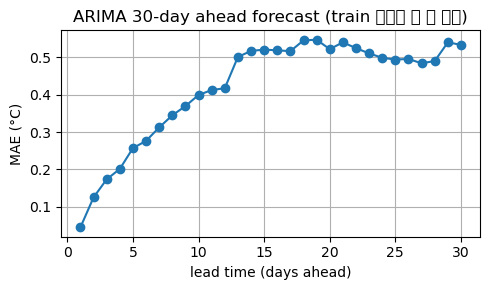

In [32]:
# test의 앞 H일 실제값
for H in horizons:
    truth_H = test[:, :, :H]           # (nY2, nX2, H)
    err_H   = truth_H - pred_h[H]      # 같은 shape

    mae_lead = np.nanmean(np.abs(err_H), axis=(0, 1))   # (H,)
    print(f"\n=== Horizon {H}일 예측 ===")
    print("lead 1~H일별 MAE:", mae_lead)
    print("평균 MAE:", float(np.nanmean(mae_lead)))

    plt.figure(figsize=(5,3))
    plt.plot(np.arange(1, H+1), mae_lead, marker="o")
    plt.xlabel("lead time (days ahead)")
    plt.ylabel("MAE (°C)")
    plt.title(f"ARIMA {H}-day ahead forecast (train 끝에서 한 번 예측)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


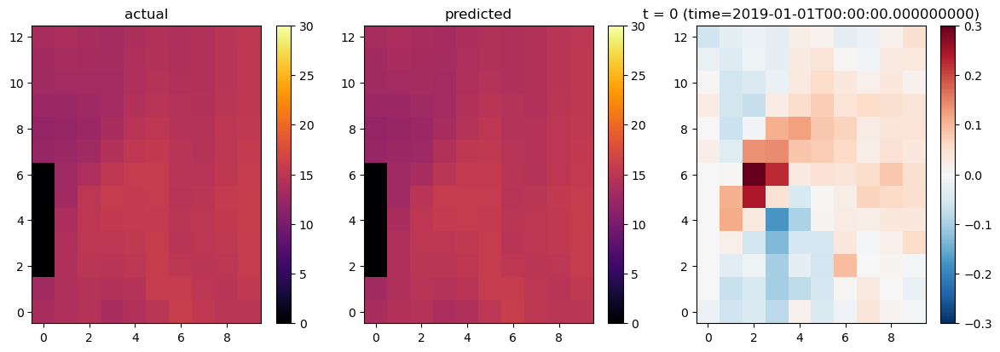

In [27]:
# ============================================
# 6. heatmap: actual / predicted / residual
# ============================================

def plot_frame(ti, stride_y=1, stride_x=1):
    """
    test 시점 index = ti 에 대해
    actual / predicted / residual 3패널 heatmap
    """
    actual_k = test[:, :, ti]
    pred_k   = pred_1step[:, :, ti]
    resid_k  = actual_k - pred_k

    # 해상도 줄이기 (optional)
    actual_k = actual_k[::stride_y, ::stride_x]
    pred_k   = pred_k[::stride_y, ::stride_x]
    resid_k  = resid_k[::stride_y, ::stride_x]

    #0을 NaN으로 안 바꾸고 clims=(0,20) 사용 → 그대로 따라감
    vmin, vmax = 0, 30   # 표층 수온 범위에 맞게 (필요하면 조정)

    maxabs = np.max(np.abs(resid_k))
    vmin_r, vmax_r = -maxabs, maxabs

    cmap_temp = plt.cm.inferno
    cmap_res  = plt.cm.RdBu_r

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    im0 = axes[0].imshow(actual_k, origin="lower",
                         aspect="equal", cmap=cmap_temp,
                         vmin=vmin, vmax=vmax)
    axes[0].set_title("actual")
    fig.colorbar(im0, ax=axes[0])

    im1 = axes[1].imshow(pred_k, origin="lower",
                         aspect="equal", cmap=cmap_temp,
                         vmin=vmin, vmax=vmax)
    axes[1].set_title("predicted")
    fig.colorbar(im1, ax=axes[1])

    im2 = axes[2].imshow(resid_k, origin="lower",
                         aspect="equal", cmap=cmap_res,
                         vmin=vmin_r, vmax=vmax_r)
    axes[2].set_title(f"t = {ti} (time={T_test[ti]})")
    fig.colorbar(im2, ax=axes[2])

    plt.tight_layout()
    plt.show()

# 예: test 첫 시점 ( t=0 hour)
plot_frame(0, stride_y=1, stride_x=1)


In [28]:
# ============================================
# 6-B. Heatmap for H-step forecasting
# ============================================

def plot_horizon_heatmap(H, lead_idx):
    """
    장기예측 heatmap:
    H = 7 or 30
    lead_idx = 0~H-1
    """
    truth = test[:, :, lead_idx]
    pred  = pred_h[H][:, :, lead_idx]
    resid = truth - pred

    vmin, vmax = 0, 30
    maxabs = np.nanmax(np.abs(resid))
    vmin_r, vmax_r = -maxabs, maxabs

    fig, axes = plt.subplots(1, 3, figsize=(12,4))

    im0 = axes[0].imshow(truth, origin='lower', cmap='inferno',
                         vmin=vmin, vmax=vmax)
    axes[0].set_title(f"Actual (lead={lead_idx+1} day)")
    fig.colorbar(im0, ax=axes[0])

    im1 = axes[1].imshow(pred, origin='lower', cmap='inferno',
                         vmin=vmin, vmax=vmax)
    axes[1].set_title("Predicted")
    fig.colorbar(im1, ax=axes[1])

    im2 = axes[2].imshow(resid, origin='lower', cmap='RdBu_r',
                         vmin=vmin_r, vmax=vmax_r)
    axes[2].set_title("Residual")
    fig.colorbar(im2, ax=axes[2])

    plt.tight_layout()
    plt.show()


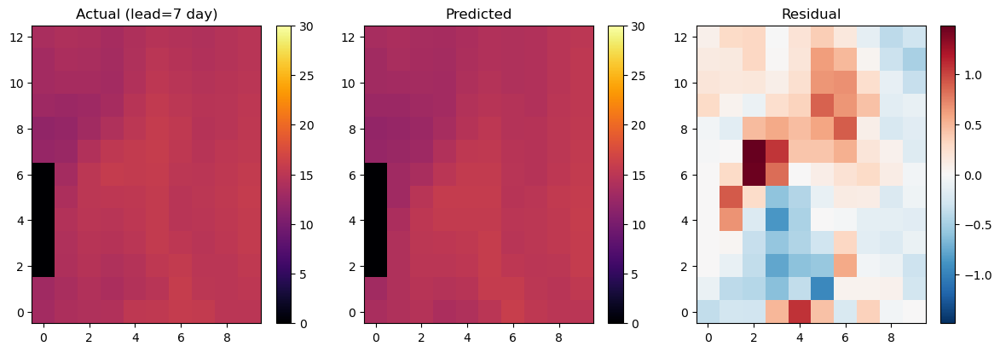

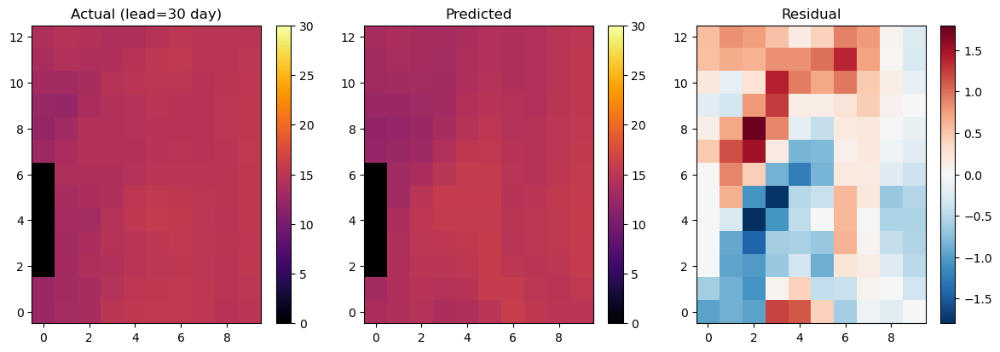

In [29]:
plot_horizon_heatmap(7, 6)   # 7일 ahead → 7번째 day
plot_horizon_heatmap(30, 29) # 30일 ahead → 30번째 day


In [30]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# --------------------------
# 1) 사용할 frame index 정의
# --------------------------
step = 24  # 24시간 간격처럼 보고 싶을 때 (test index 단위)
max_t = min(36500, nTest)  # nTest가 3125면 자동으로 3125까지만 사용
frames = list(range(0, max_t, step))

print("총 프레임 수:", len(frames))

# --------------------------
# 2) 색 범위 미리 결정 (깜빡임 방지)
# --------------------------
# temp 색 범위 (0~30도 정도, 필요하면 조정)
vmin, vmax = 0, 30

# residual 범위 (전 test 구간에서 최대 절대값)
resid_all = test - pred_1step      # ★ 여기 수정
maxabs = np.nanmax(np.abs(resid_all))
vmin_r, vmax_r = -maxabs, maxabs

# --------------------------
# 3) figure / axes / 초기 이미지 생성
# --------------------------
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# 초기 시점은 첫 프레임
ti0 = frames[0]
a0 = test[:, :, ti0]
p0 = pred_1step[:, :, ti0]         # ★ 여기 수정
r0 = a0 - p0

cmap_temp = plt.cm.inferno
cmap_res  = plt.cm.RdBu_r

im0 = axes[0].imshow(a0, origin="lower", aspect="equal",
                     cmap=cmap_temp, vmin=vmin, vmax=vmax)
axes[0].set_title(f"actual @ {T_test[ti0]}")
cbar0 = fig.colorbar(im0, ax=axes[0])

im1 = axes[1].imshow(p0, origin="lower", aspect="equal",
                     cmap=cmap_temp, vmin=vmin, vmax=vmax)
axes[1].set_title("ARIMA 1-step forecast")
cbar1 = fig.colorbar(im1, ax=axes[1])

im2 = axes[2].imshow(r0, origin="lower", aspect="equal",
                     cmap=cmap_res, vmin=vmin_r, vmax=vmax_r)
axes[2].set_title("residual")
cbar2 = fig.colorbar(im2, ax=axes[2])

plt.tight_layout()

# --------------------------
# 4) 업데이트 함수 정의
# --------------------------
def update(frame_idx):
    ti = frames[frame_idx]
    a = test[:, :, ti]
    p = pred_1step[:, :, ti]       # ★ 여기 수정
    r = a - p

    im0.set_data(a)
    im1.set_data(p)
    im2.set_data(r)

    axes[0].set_title(f"actual @ {T_test[ti]}")
    axes[1].set_title(f"ARIMA 1-step forecast @ {T_test[ti]}")
    axes[2].set_title(f"residual @ {T_test[ti]}")

    return [im0, im1, im2]

# --------------------------
# 5) 애니메이션 생성
# --------------------------
ani = FuncAnimation(
    fig,
    update,
    frames=len(frames),
    interval=300,   # ms 단위. 300이면 0.3초마다 한 프레임
    blit=False
)

plt.close(fig)  # 중복 출력 방지
HTML(ani.to_jshtml())


총 프레임 수: 131


In [35]:
frames = list(range(30))

def update_long(frame):
    a = test[:, :, frame]
    p = pred_h[30][:, :, frame]
    r = a - p

    im0.set_data(a)
    im1.set_data(p)
    im2.set_data(r)

    axes[0].set_title(f"actual (lead={frame+1}d)")
    axes[1].set_title(f"predicted")
    axes[2].set_title(f"residual")

    return [im0, im1, im2]

ani = FuncAnimation(fig, update_long, frames=len(frames), interval=500)
HTML(ani.to_jshtml())


## ARIMA 1,1,1 고른 이유

In [18]:
import numpy as np

# trng: (nY, nX, nTrain)  ← 우리가 이미 만든 train 텐서
nY2, nX2, nTrain = trng.shape

# 각 격자별로 "0이 아닌 값 개수" 세기
nonzero_counts = np.count_nonzero(trng, axis=2)

# 관측이 가장 많은 격자 (iy, ix)
iy, ix = np.unravel_index(np.argmax(nonzero_counts), nonzero_counts.shape)
print("대표 격자 index (iy, ix) =", iy, ix)

series = trng[iy, ix, :].astype(float)
print("시계열 길이:", len(series))


대표 격자 index (iy, ix) = 0 0
시계열 길이: 5758


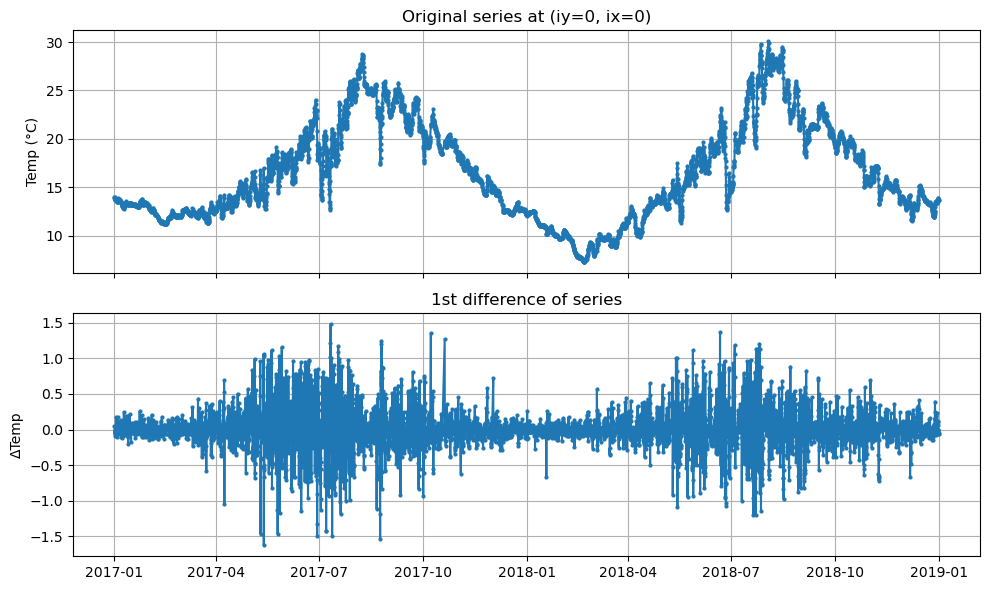

In [19]:
import matplotlib.pyplot as plt
import pandas as pd

# 시간축도 같이 잘라주기
t_train = pd.to_datetime(T_train)   # numpy datetime64 → pandas DatetimeIndex

fig, axes = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

axes[0].plot(t_train, series, marker="o", markersize=2)
axes[0].set_title(f"Original series at (iy={iy}, ix={ix})")
axes[0].set_ylabel("Temp (°C)")
axes[0].grid(True)

# 1차 차분
diff_series = np.diff(series)
t_diff = t_train[1:]

axes[1].plot(t_diff, diff_series, marker="o", markersize=2)
axes[1].set_title("1st difference of series")
axes[1].set_ylabel("ΔTemp")
axes[1].grid(True)

plt.tight_layout()
plt.show()


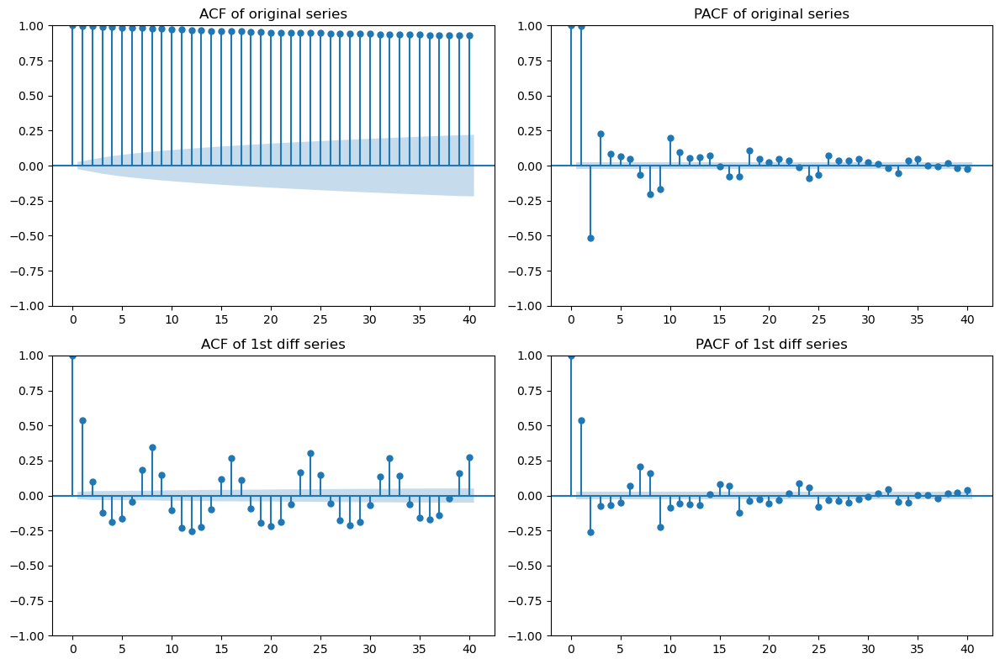

In [20]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# ACF/PACF 그릴 최대 시차
MAX_LAG = 40

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# (1,1) 원 시계열 ACF
plot_acf(series, ax=axes[0,0], lags=MAX_LAG)
axes[0,0].set_title("ACF of original series")

# (1,2) 원 시계열 PACF
plot_pacf(series, ax=axes[0,1], lags=MAX_LAG, method="ywm")
axes[0,1].set_title("PACF of original series")

# (2,1) 1차 차분 ACF
plot_acf(diff_series, ax=axes[1,0], lags=MAX_LAG)
axes[1,0].set_title("ACF of 1st diff series")

# (2,2) 1차 차분 PACF
plot_pacf(diff_series, ax=axes[1,1], lags=MAX_LAG, method="ywm")
axes[1,1].set_title("PACF of 1st diff series")

plt.tight_layout()
plt.show()


# 2025 11 19 세미나 피드백 !
- SARIMA 적용
- INPUT -> OUTPUT 늘리기 아웃풋 장기예측으로 